# Cross-country sectoral equity strategy

This notebook offers the necessary code to replicate the research findings discussed in the corresponding Macrosynergy research post. Its primary objective is to inspire readers to explore and conduct additional investigations whilst also providing a foundation for testing their own unique ideas.

The notebook leverages nine sets of macro quantamental indicators to construct a relative signal for each of the 11 GICS sectors across 12 developed market equity markets. We use a benchmark signal in the form of conceptual risk parity score to show that a relatively simple yet robust statistical learning produces added value in this setting, when a set of economically plausible features is selected.
Moreover, we show that a combination of the positions across sectors has superior performance vs the same strategy applied at country-index level. 

The notebook covers the three main parts:

- Get Packages and JPMaQS Data: This section is responsible for installing and importing the necessary Python packages used throughout the analysis.
- Transformations and checks: This section computes the approproate quantamental information, builds the combined sector aggregates, applies imputation across countries, and construct relative country scores. 
- Value checks: This section builds statistical learning and conceptual parity signals across all sectors, and analyses the quality of the predictions as well as the PnL.

It is important to note that while the notebook covers a selection of indicators and strategies used for the post’s main findings, users can explore countless other possible indicators and approaches. Users can modify the code to test different hypotheses and strategies based on their research and ideas. Best of luck with your research!

## Get packages and JPMaQS data

This notebook primarily relies on the standard packages available in the Python data science stack. However, there is an additional package `macrosynergy` that is required for two purposes:

- Downloading JPMaQS data: The `macrosynergy` package facilitates the retrieval of JPMaQS data, which is used in the notebook.

- For the analysis of quantamental data and value propositions: The `macrosynergy` package provides functionality for performing quick analyses of quantamental data and exploring value propositions.

For detailed information and a comprehensive understanding of the `macrosynergy` package and its functionalities, please refer to the [“Introduction to Macrosynergy package”](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php) notebook on the Macrosynergy Quantamental Academy or visit the following link on [Kaggle](https://www.kaggle.com/code/macrosynergy/introduction-to-macrosynergy-package).

In [1]:
import copy
import warnings
import os
from tqdm import tqdm
import gc

import numpy as np
import pandas as pd
from pandas import Timestamp
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer, mean_squared_error

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.signal as mss
import macrosynergy.pnl as msn
import macrosynergy.learning as msl
import macrosynergy.visuals as msv

from macrosynergy.panel.panel_imputer import MeanPanelImputer
from macrosynergy.download import JPMaQSDownload

warnings.simplefilter("ignore")

This notebook downloads selected indicators for the following cross-sections: AUD (Australian dollar), CAD (Canadian dollar), CHF (Swiss franc), EUR (euro), GBP (British pound),  HKD (Hong Kong dollar),  ILS (Israeli shekel), JPY (Japanese yen), NOK (Norwegian krone), NZD (New Zealand dollar), SEK (Swedish krona), SGD (Singapore dollar), USD (U.S. dollar) as well as five main European currencies  ['DEM', 'ESP', 'FRF', 'ITL', 'NLG'], replaced by EUR.

In [2]:
# Equity sectoral cross-section lists: excluding HKD
cids_dmeq = ['AUD', 'CAD', 'CHF', 'EUR', 'GBP', 'ILS', 'JPY', 'NOK', 'NZD', 'SEK', 'SGD', 'USD']
cids_eueq = ['DEM', 'ESP', 'FRF', 'ITL', 'NLG']

cids = sorted(cids_dmeq + cids_eueq)
cids_eqx = sorted(list(set(cids_dmeq) - {'HKD'}))

In [3]:
sector_labels = {
    "ALL": "All sectors", 
    "COD": "Cons. discretionary",
    "COS": "Cons. staples",
    "CSR": "Communication services",
    "ENR": "Energy",
    "FIN": "Financials",
    "HLC": "Healthcare",
    "IND": "Industrials",
    "ITE": "Information tech",
    "MAT": "Materials",
    "REL": "Real estate",
    "UTL": "Utilities",
}
secx = list(sector_labels.keys())
secs = list(sector_labels.keys())[1:]

JPMaQS indicators are conveniently grouped into 6 main categories: Economic Trends, Macroeconomic balance sheets, Financial conditions, Shocks and risk measures, Stylized trading factors, and Generic returns. Each indicator has a separate page with notes, description, availability, statistical measures, and timelines for main currencies. The description of each JPMaQS category is available either under [JPMorgan Markets](https://markets.jpmorgan.com/#jpmaqs) (password protected) or the [Macro Quantamental Academy](https://academy.macrosynergy.com/quantamental-indicators/). 

In particular, the indicators used in this notebook can be found under [consumer price inflation trends](https://macrosynergy.com/academy/notebooks/consumer-price-inflation-trends/) , [labor market dynamics](https://macrosynergy.com/academy/notebooks/labor-market-dynamics/), [demographic trends](https://macrosynergy.com/academy/notebooks/demographic-trends/), [real effective appreciation](https://macrosynergy.com/academy/notebooks/real-effective-appreciation/), [terms of trade](https://macrosynergy.com/academy/notebooks/terms-of-trade/), [manufacuring scores changes](https://macrosynergy.com/academy/notebooks/manufacturing-confidence-scores/), [external ratio trends](https://macrosynergy.com/academy/notebooks/external-ratios-trends/), [monetary aggregates](https://macrosynergy.com/academy/notebooks/monetary-aggregates/), and [private consumption trends](https://macrosynergy.com/academy/notebooks/private-consumption/).

In [4]:
# Category tickers

# Economic indicators

ecos_groups = {
    "XINF_NEG": [
        "CPIH_SA_P1M1ML12",
        "CPIH_SJA_P6M6ML6AR",
        "CPIC_SA_P1M1ML12",
        "CPIC_SJA_P6M6ML6AR",
        "INFTEFF_NSA",
    ],
    "LAB_SLACK": [
        "EMPL_NSA_P1M1ML12_3MMA",
        "EMPL_NSA_P1Q1QL4",
        "UNEMPLRATE_NSA_3MMA_D1M1ML12",
        "UNEMPLRATE_NSA_D1Q1QL4",
        "WFORCE_NSA_P1Y1YL1",
        "WFORCE_NSA_P1Q1QL4",
    ],
    "FX_DEPREC": [
        "REEROADJ_NSA_P1M1ML12",
        "NEEROADJ_NSA_P1M1ML12",
        "REER_NSA_P1M1ML12",
    ],
    "EASE_FIN": [
        "RIR_NSA",
    ],
    "CTOT_PCH": [
        "CTOT_NSA_P1M1ML12",
        "CTOT_NSA_P1M12ML1",
        "CTOT_NSA_P1W4WL1",
    ],
    "MCONF_CHG": [
        # Manufacturing confidence scores
        "MBCSCORE_SA_D3M3ML3",
        "MBCSCORE_SA_D6M6ML6",
    ],
    "MTB_CHG": [
        "MTBGDPRATIO_SA_3MMA_D1M1ML3",
        "MTBGDPRATIO_SA_6MMA_D1M1ML6",
    ],
    "MONEY_PCHG": [
        "MNARROW_SJA_P1M1ML12",
        "MBROAD_SJA_P1M1ML12",
    ],
    "CONS_NEG": [
        # retail sales
        "RRSALES_SA_P1M1ML12_3MMA",
        "RRSALES_SA_P1Q1QL4",
        # Real private consumption trend
        "RPCONS_SA_P1M1ML12_3MMA",
        "RPCONS_SA_P1Q1QL4",
    ],
}

main_ecos = [cat for cat_grp in ecos_groups.values() for cat in cat_grp]

# Complementary economic indicators
added_ecos = [
    "RGDP_SA_P1Q1QL4_20QMM",
    "INFE1Y_JA",
]

all_ecos = main_ecos + added_ecos

# Market indicators
eqrets = ["EQC" + sec + ret for sec in secx for ret in ["XR_NSA", "XR_VT10", "R_NSA", "R_VT10"]]
eqblack = ["EQC" + sec + "UNTRADABLE_NSA" for sec in secx]
bmrs = ["USD_EQXR_NSA", "USD_EQXR_VT10"]  # U.S. equity returns for correlation analysis
marks = eqrets + eqblack

# All indicators
xcats = all_ecos + marks

# Resultant tickers
tickers = [cid + "_" + xcat for cid in cids for xcat in xcats] + bmrs
print(f"Maximum number of tickers is {len(tickers)}")

Maximum number of tickers is 1532


The JPMaQS indicators we consider are downloaded using the J.P. Morgan Dataquery API interface within the `macrosynergy` package. This is done by specifying ticker strings, formed by appending an indicator category code <category> to a currency area code <cross_section>. These constitute the main part of a full quantamental indicator ticker, taking the form `DB(JPMAQS,<cross_section>_<category>,<info>)`, where <info> denotes the time series of information for the given cross-section and category. The following types of information are available:

`value` giving the latest available values for the indicator
`eop_lag` referring to days elapsed since the end of the observation period
`mop_lag` referring to the number of days elapsed since the mean observation period
`grade` denoting a grade of the observation, giving a metric of real-time information quality.

After instantiating the `JPMaQSDownload` class within the `macrosynergy.download` module, one can use the `download(tickers,start_date,metrics)` method to easily download the necessary data, where `tickers` is an array of ticker strings, `start_date` is the first collection date to be considered and `metrics` is an array comprising the times series information to be downloaded. For more information see [here](https://github.com/macrosynergy/macrosynergy/blob/develop/README.md).


In [5]:
client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

with JPMaQSDownload(oauth=True, client_id=client_id, client_secret=client_secret) as dq:
    assert dq.check_connection()
    df = dq.download(
        tickers=tickers,
        start_date="1990-01-01",
        suppress_warning=True,
        metrics=["value"],
        show_progress=True,
    )
    assert isinstance(df, pd.DataFrame) and not df.empty

Timestamp UTC:  2025-01-31 13:13:03
Connection successful!


Requesting data: 100%|█████████████████████████████████████████████████████████████████| 77/77 [00:16<00:00,  4.77it/s]


Some expressions are missing from the downloaded data. Check logger output for complete list.
170 out of 1532 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.
Some dates are missing from the downloaded data. 
2 out of 9157 dates are missing.


In [6]:
dfx = df.copy()

### Renaming and availability

In [7]:
# Rename quarterly tickers to equivalent monthly tickers

dict_repl = {
    # labour
    "EMPL_NSA_P1Q1QL4": "EMPL_NSA_P1M1ML12_3MMA",
    "UNEMPLRATE_NSA_D1Q1QL4": "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "WFORCE_NSA_P1Y1YL1": "WFORCE_NSA_P1Q1QL4",
    # private consumption
    "RPCONS_SA_P1Q1QL4": "RPCONS_SA_P1M1ML12_3MMA",
    "RRSALES_SA_P1Q1QL4": "RRSALES_SA_P1M1ML12_3MMA",
}

for key, value in dict_repl.items():
    # Replace in dataframe
    dfx["xcat"] = dfx["xcat"].str.replace(key, value)

    # Remove quarterly categories in ecos_groups dictionary
    for grp_name, cat_grp in ecos_groups.items():
        if key in cat_grp:
            ecos_groups[grp_name] = list(set(cat_grp) - {key})
            
ecos = [cat for cat_grp in ecos_groups.values() for cat in cat_grp]

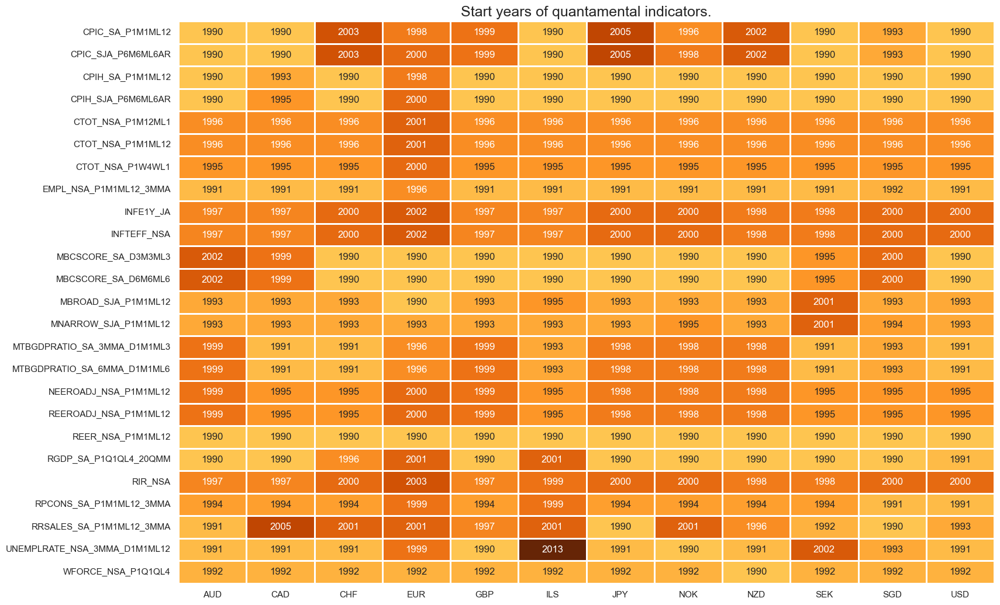

In [8]:
xcatx = list(set(ecos + added_ecos) - set(dict_repl.keys()))
cidx = cids_eqx

msm.check_availability(dfx, xcats=xcatx, cids=cidx, missing_recent=False)

## Transformations and checks

### Directional factors

#### Inflation shortfall

In [9]:
# Negative of excess inflation

cidx = cids_eqx

cpi_cats = [
    "CPIH_SA_P1M1ML12",
    "CPIH_SJA_P6M6ML6AR",
    "CPIC_SA_P1M1ML12",
    "CPIC_SJA_P6M6ML6AR",
]
inf_calcs = {f"X{cpi_cat}_NEG": f"- {cpi_cat} + INFTEFF_NSA" for cpi_cat in cpi_cats}

dfa = msp.panel_calculator(
    dfx, calcs=[" = ".join([k, v]) for k, v in inf_calcs.items()], cids=cidx
)
dfx = msm.update_df(dfx, dfa)

In [10]:
# Combined excess CPI inflation indicators

cidx = cids_eqx
xcatx = list(inf_calcs.keys())


macro_cat = "XINF_NEG"
combined_macro = {}  # initiate summary dictionary for factors and constituents
combined_macro[macro_cat] = xcatx  # update summary dictionary

# combining the single indicators into a group-level indicator
dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat=macro_cat,
)
dfx = msm.update_df(dfx, dfa)

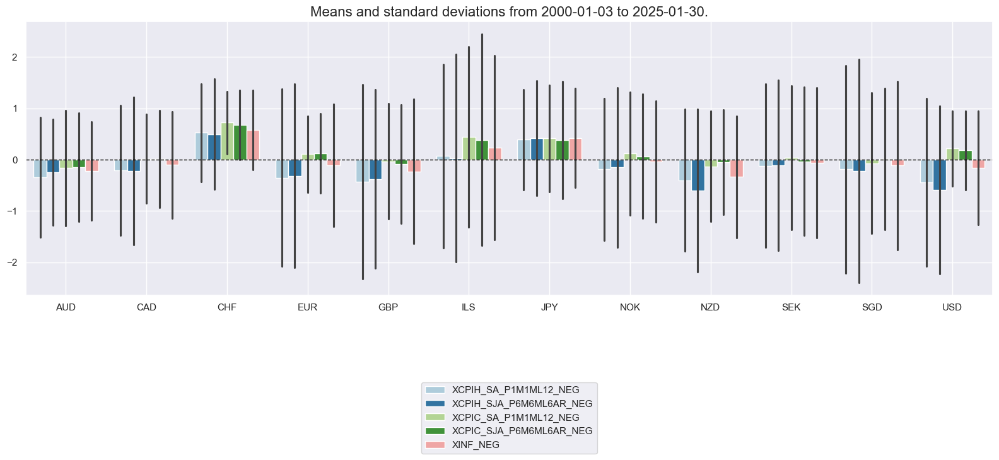

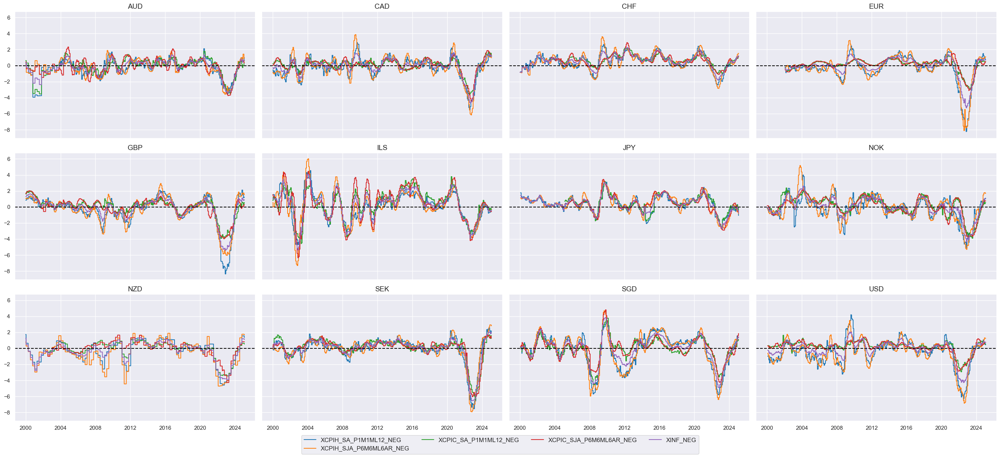

In [11]:
cidx = cids_eqx
xcatx = combined_macro["XINF_NEG"] + ["XINF_NEG"]

msp.view_ranges(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    kind="bar",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title=None,
    cumsum=False,
    ncol=4,
    same_y=True,
    all_xticks=False,
    xcat_grid=False,
)

#### Labour market slackening

In [12]:
cidx = cids_eqx

lab_calcs = {
     # Excess employment growth
    "XEMPL_NSA_P1M1ML12_3MMA_NEG": "- EMPL_NSA_P1M1ML12_3MMA + WFORCE_NSA_P1Q1QL4",
    "UNEMPLRATE_NSA_3MMA_D1M1ML12": "UNEMPLRATE_NSA_3MMA_D1M1ML12"
}
dfa = msp.panel_calculator(
    dfx, 
    calcs=[" = ".join([k, v]) for k, v in lab_calcs.items()], 
    cids=cidx
)

dfx = msm.update_df(dfx, dfa)

In [13]:
# Combined labor market indicator

cidx = cids_eqx
xcatx = list(lab_calcs.keys())

macro_cat = "LAB_SLACK"
combined_macro[macro_cat] = xcatx  # update summary dictionary

# combining the single indicators into a group-level indicator
dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat=macro_cat,
)
dfx = msm.update_df(dfx, dfa)

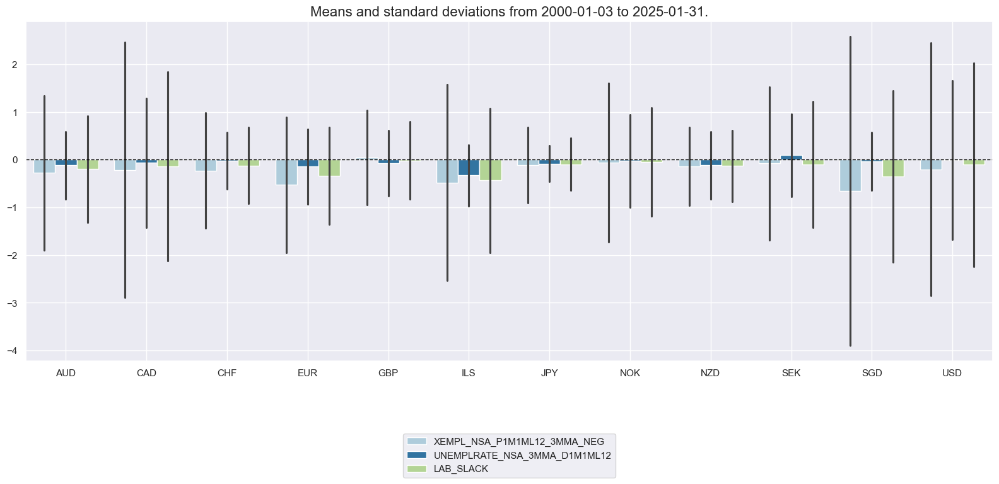

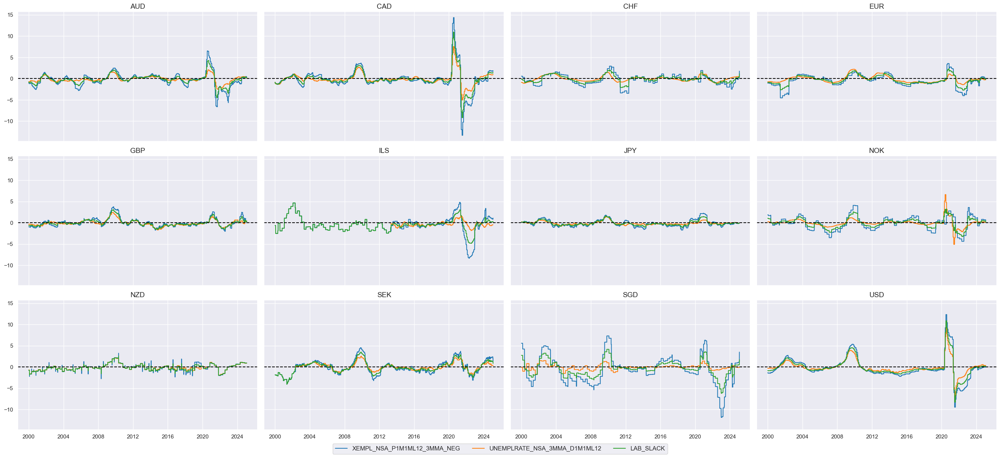

In [14]:
cidx = cids_eqx
xcatx = combined_macro["LAB_SLACK"] + ["LAB_SLACK"]

msp.view_ranges(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    kind="bar",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title=None,
    cumsum=False,
    ncol=4,
    same_y=True,
    all_xticks=False,
    xcat_grid=False,
)

#### Effective currency depreciation

In [15]:
cidx = cids_eqx

fxd_calcs = {
    f"{depr}_NEG": f"- {depr}" for depr in ecos_groups["FX_DEPREC"]
}
dfa = msp.panel_calculator(
    dfx, 
    calcs=[" = ".join([k, v]) for k, v in fxd_calcs.items()], 
    cids=cidx
)

dfx = msm.update_df(dfx, dfa)

In [16]:
# Combined depreciation metric

cidx = cids_eqx
xcatx = list(fxd_calcs.keys())


macro_cat = "FX_DEPREC"
combined_macro[macro_cat] = xcatx  # update summary dictionary

# combining the single indicators into a group-level indicator
dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat=macro_cat,
)
dfx = msm.update_df(dfx, dfa)

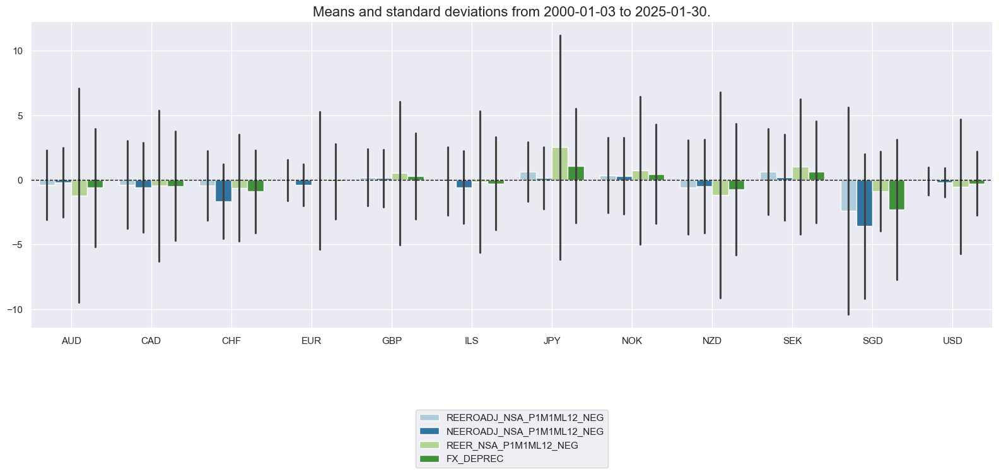

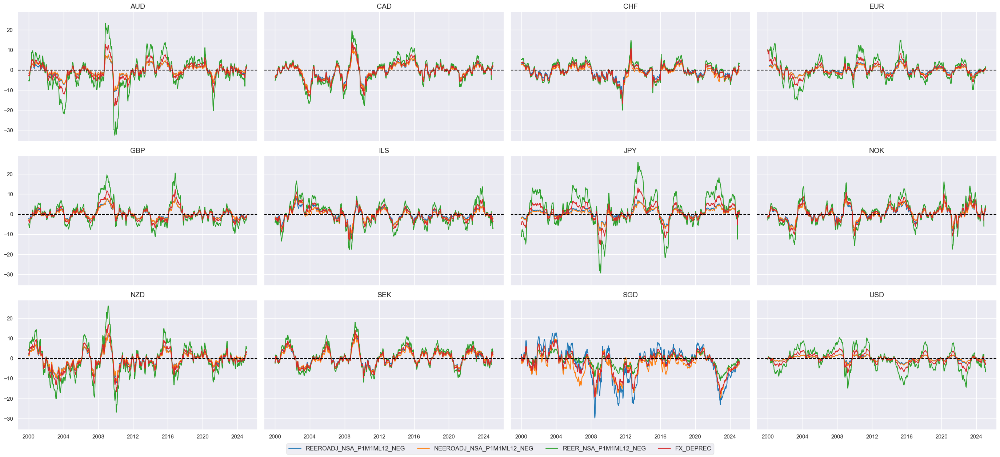

In [17]:
cidx = cids_eqx
xcatx = combined_macro["FX_DEPREC"] + ["FX_DEPREC"]

msp.view_ranges(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    kind="bar",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title=None,
    cumsum=False,
    ncol=4,
    same_y=True,
    all_xticks=False,
    xcat_grid=False,
)

#### Ease of local finance

In [18]:
# Real interest rate levels and changes

cidx = cids_eqx

elf_calcs = {
    "XRIR_NSA_NEG": "- ( RIR_NSA - INFTEFF_NSA + INFE1Y_JA ) + RGDP_SA_P1Q1QL4_20QMM - WFORCE_NSA_P1Q1QL4",
    "XRIR_NSA_NEG_P1M1ML12": "XRIR_NSA_NEG.rolling(21).mean() - XRIR_NSA_NEG.rolling(21).mean().shift(262)",
}
dfa = msp.panel_calculator(
    dfx, 
    calcs=[" = ".join([k, v]) for k, v in elf_calcs.items()], 
    cids=cidx
)

dfx = msm.update_df(dfx, dfa)

In [19]:
# Combined excess CPI inflation indicators

cidx = cids_eqx
xcatx = list(elf_calcs.keys())


macro_cat = "EASE_FIN"
combined_macro[macro_cat] = xcatx  # update summary dictionary

# combining the single indicators into a group-level indicator
dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat=macro_cat,
)
dfx = msm.update_df(dfx, dfa)

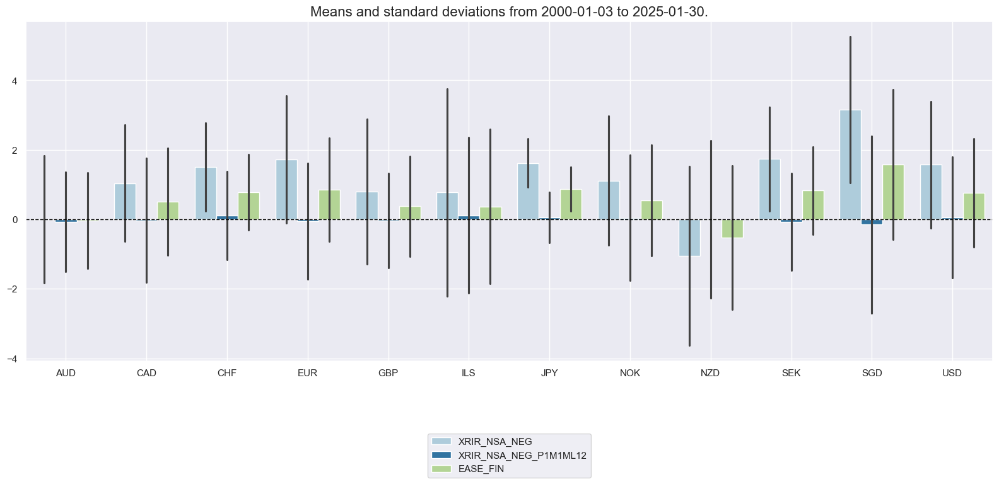

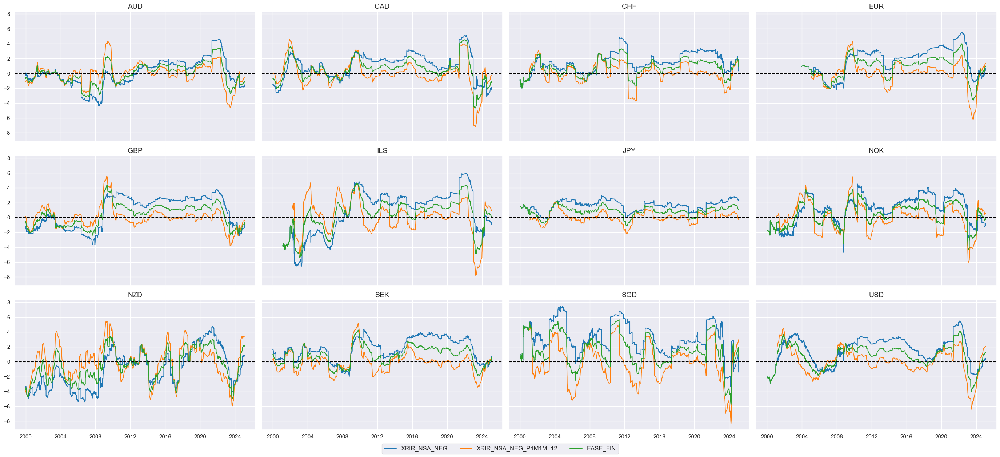

In [20]:
cidx = cids_eqx
xcatx = combined_macro["EASE_FIN"] + ["EASE_FIN"]

msp.view_ranges(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    kind="bar",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title=None,
    cumsum=False,
    ncol=4,
    same_y=True,
    all_xticks=False,
    xcat_grid=False,
)

#### Terms of trade improvement

In [21]:
# Winsorized terms-of-trade changes

tot_calcs = {
    "CTOT_NSA_P1M1ML12W10": "CTOT_NSA_P1M1ML12.clip(lower=-10, upper=10)",
    "CTOT_NSA_P1M12ML1ARW10": "( 2 * CTOT_NSA_P1M12ML1 ).clip(lower=-10, upper=10)",
}
dfa = msp.panel_calculator(
    dfx, 
    calcs=[" = ".join([k, v]) for k, v in tot_calcs.items()], 
    cids=cids
)

dfx = msm.update_df(dfx, dfa)

In [22]:
# Combined terms-of-trade dynamics

cidx = cids_eqx
xcatx = list(tot_calcs.keys())


macro_cat = "CTOT_PCH"
combined_macro[macro_cat] = xcatx  # update summary dictionary

# combining the single indicators into a group-level indicator
dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat=macro_cat,
)
dfx = msm.update_df(dfx, dfa)

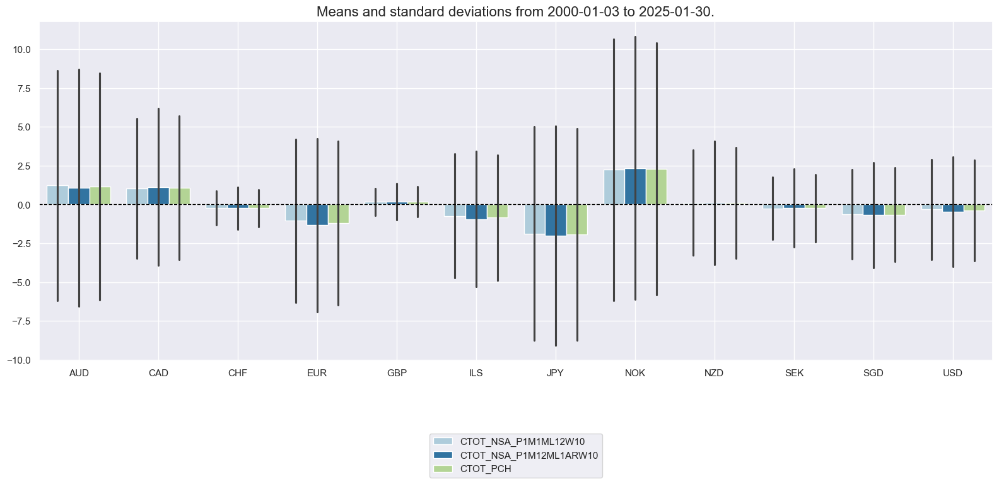

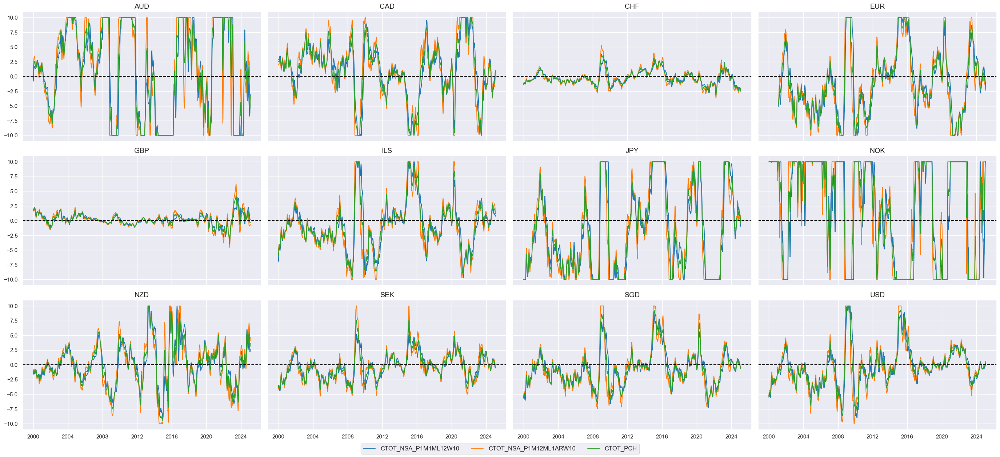

In [23]:
cidx = cids_eqx
xcatx = combined_macro["CTOT_PCH"] + ["CTOT_PCH"]

msp.view_ranges(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    kind="bar",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title=None,
    cumsum=False,
    ncol=4,
    same_y=True,
    all_xticks=False,
    xcat_grid=False,
)

#### Manufacturing confidence improvement

In [24]:
cidx = cids_eqx

man_calcs = {
     # Excess employment growth
    "MBCSCORE_SA_D3M3ML3AR": "4 * MBCSCORE_SA_D3M3ML3",
    "MBCSCORE_SA_D6M6ML6AR": "2 * MBCSCORE_SA_D6M6ML6"
}
dfa = msp.panel_calculator(
    dfx, 
    calcs=[" = ".join([k, v]) for k, v in man_calcs.items()], 
    cids=cidx
)

dfx = msm.update_df(dfx, dfa)

In [25]:
# Combined confidence increase indicator

cidx = cids_eqx
xcatx = list(man_calcs.keys())


macro_cat = "MCONF_CHG"
combined_macro[macro_cat] = xcatx  # update summary dictionary

# combining the single indicators into a group-level indicator
dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat=macro_cat,
)
dfx = msm.update_df(dfx, dfa)

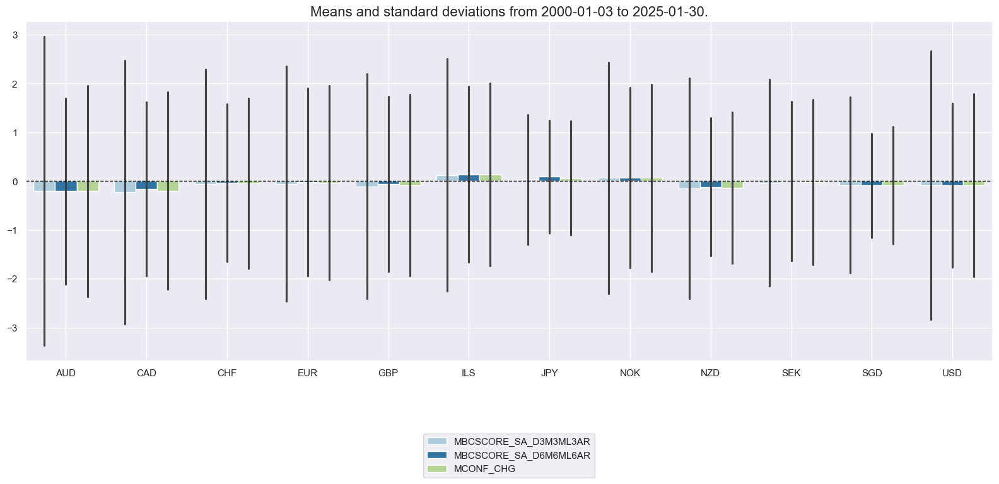

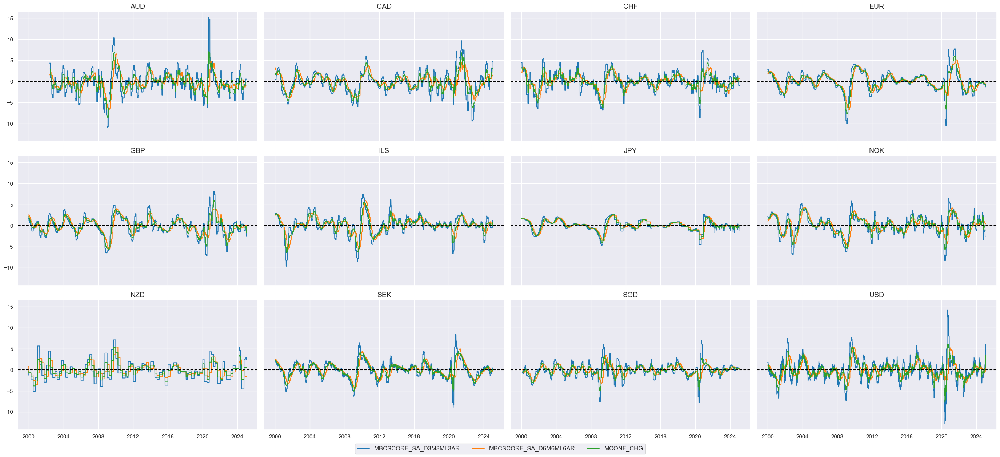

In [26]:
cidx = cids_eqx
xcatx = combined_macro["MCONF_CHG"] + ["MCONF_CHG"]

msp.view_ranges(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    kind="bar",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title=None,
    cumsum=False,
    ncol=4,
    same_y=True,
    all_xticks=False,
    xcat_grid=False,
)

#### Trade balance improvement

In [27]:
cidx = cids_eqx

mtb_calcs = {
    "MTBGDPRATIO_SA_3MMA_D1M1ML3AR": "4 * MTBGDPRATIO_SA_3MMA_D1M1ML3",
    "MTBGDPRATIO_SA_6MMA_D1M1ML6AR": "2 * MTBGDPRATIO_SA_6MMA_D1M1ML6"
}
dfa = msp.panel_calculator(
    dfx, 
    calcs=[" = ".join([k, v]) for k, v in mtb_calcs.items()], 
    cids=cidx
)

dfx = msm.update_df(dfx, dfa)

In [28]:
# Combined confidence increase indicator

cidx = cids_eqx
xcatx = list(mtb_calcs.keys())


macro_cat = "MTB_CHG"
combined_macro[macro_cat] = xcatx  # update summary dictionary

# combining the single indicators into a group-level indicator
dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat=macro_cat,
)
dfx = msm.update_df(dfx, dfa)

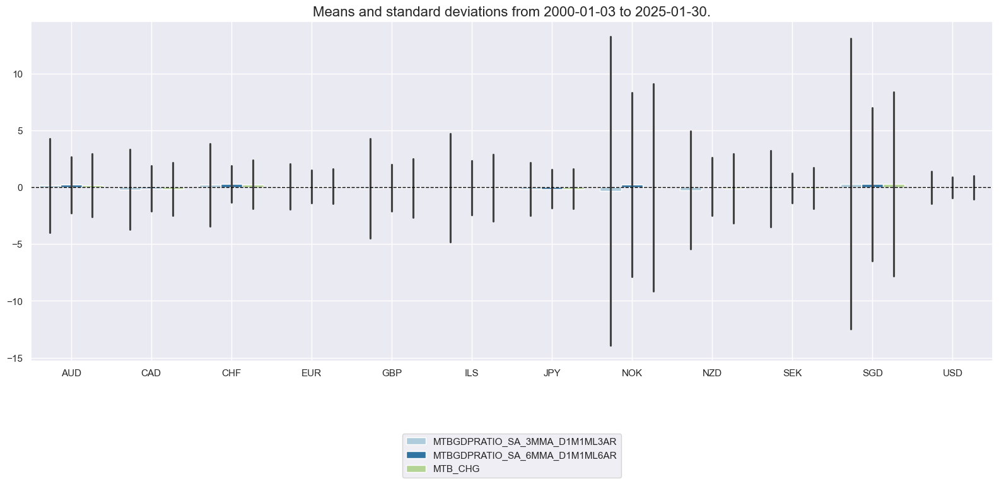

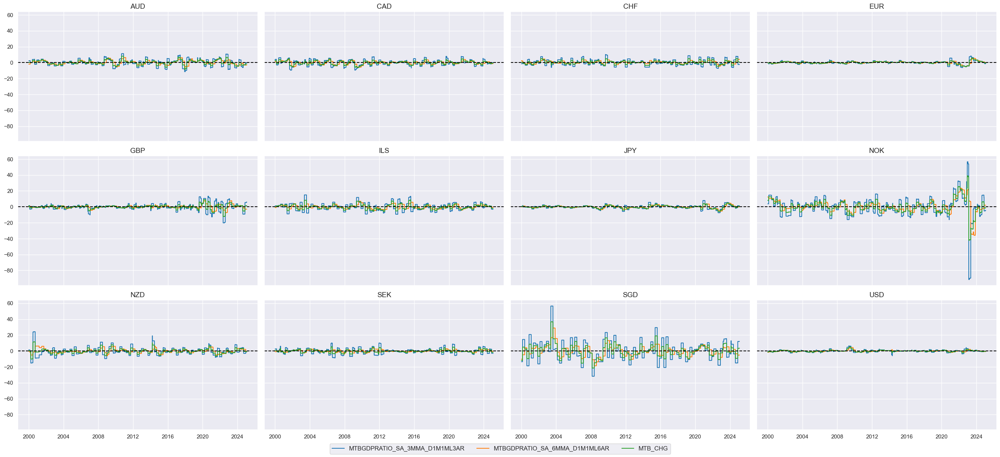

In [29]:
cidx = cids_eqx
xcatx = combined_macro["MTB_CHG"] + ["MTB_CHG"]

msp.view_ranges(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    kind="bar",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title=None,
    cumsum=False,
    ncol=4,
    same_y=True,
    all_xticks=False,
    xcat_grid=False,
)

#### Money growth

In [30]:
# Combined money growth

cidx = cids_eqx
xcatx = ecos_groups["MONEY_PCHG"]


macro_cat = "MONEY_PCHG"
combined_macro[macro_cat] = xcatx  # update summary dictionary

# combining the single indicators into a group-level indicator
dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat=macro_cat,
)
dfx = msm.update_df(dfx, dfa)

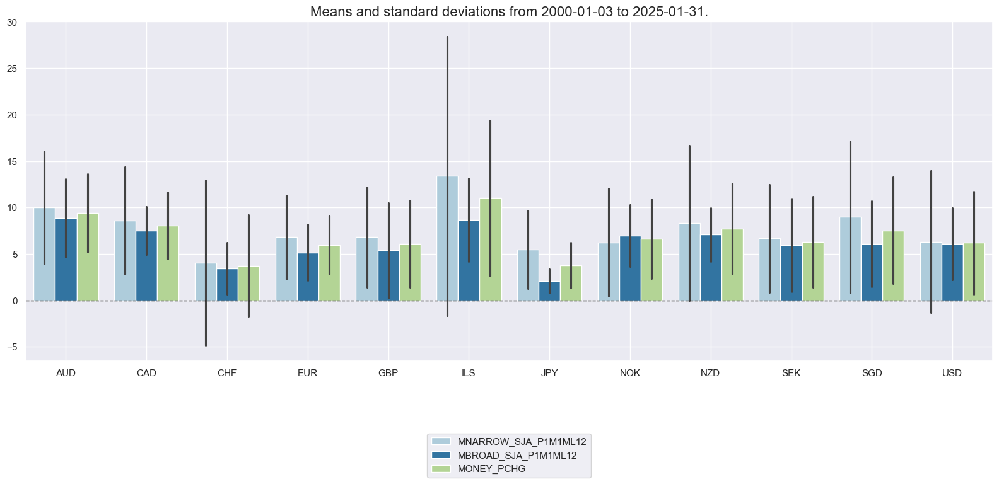

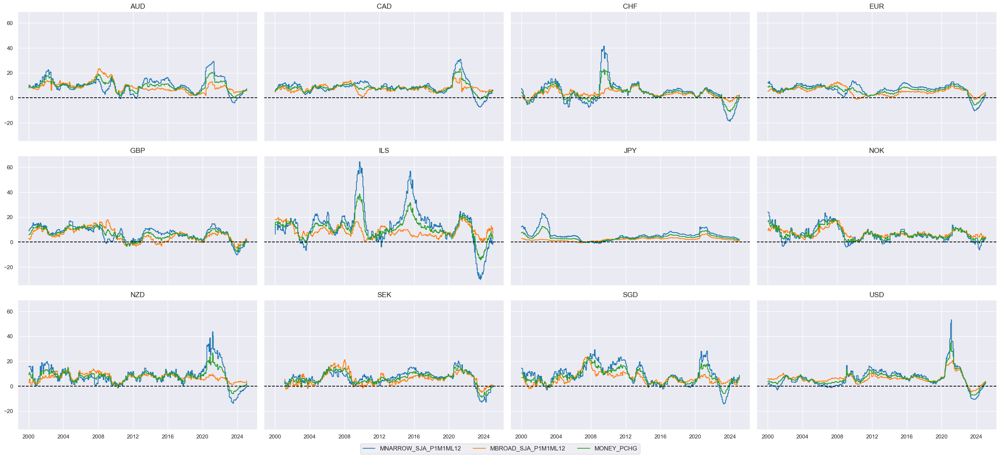

In [31]:
cidx = cids_eqx
xcatx = combined_macro["MONEY_PCHG"] + ["MONEY_PCHG"]

msp.view_ranges(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    kind="bar",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title=None,
    cumsum=False,
    ncol=4,
    same_y=True,
    all_xticks=False,
    xcat_grid=False,
)

#### Excess private consumption growth

In [32]:
con_calcs = {
    "XRPCONS_SA_P1M1ML12_3MMA_NEG": "- RPCONS_SA_P1M1ML12_3MMA + RGDP_SA_P1Q1QL4_20QMM",
    "XRRSALES_SA_P1M1ML12_3MMA_NEG": "- RRSALES_SA_P1M1ML12_3MMA + RGDP_SA_P1Q1QL4_20QMM",
}
dfa = msp.panel_calculator(
    dfx, 
    calcs=[" = ".join([k, v]) for k, v in con_calcs.items()], 
    cids=cids
)

dfx = msm.update_df(dfx, dfa)

In [33]:
# Combined confidence increase indicator

cidx = cids_eqx
xcatx = list(con_calcs.keys())


macro_cat = "CONS_NEG"
combined_macro[macro_cat] = xcatx  # update summary dictionary

# combining the single indicators into a group-level indicator
dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat=macro_cat,
)
dfx = msm.update_df(dfx, dfa)

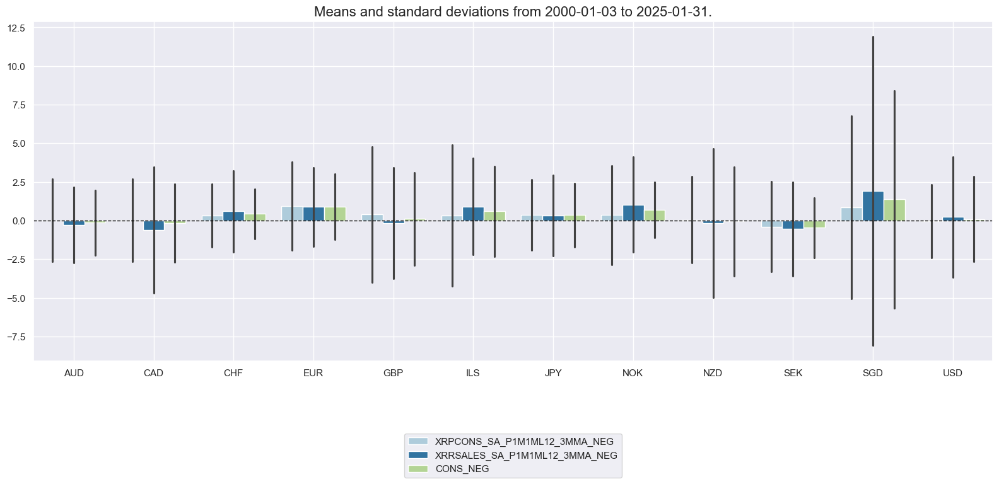

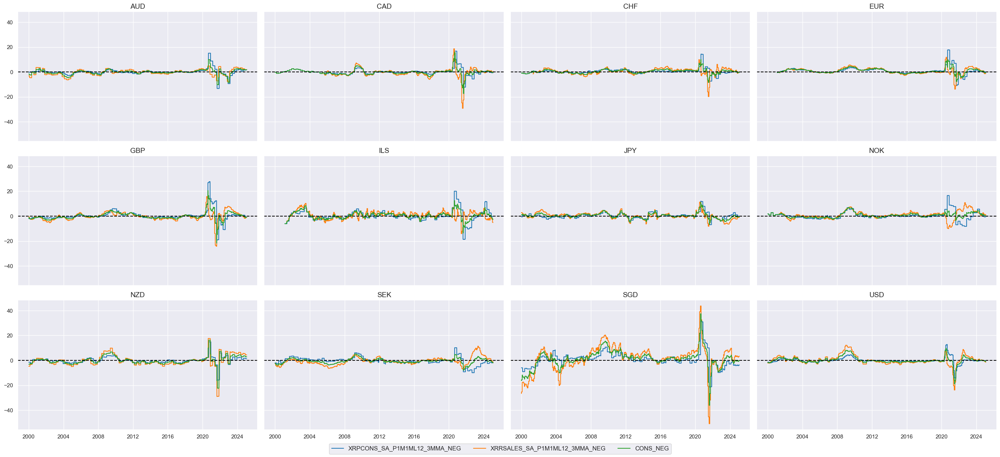

In [34]:
cidx = cids_eqx
xcatx = combined_macro["CONS_NEG"] + ["CONS_NEG"]

msp.view_ranges(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    kind="bar",
)

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    title=None,
    cumsum=False,
    ncol=4,
    same_y=True,
    all_xticks=False,
    xcat_grid=False,
)

### Directional factors with imputations

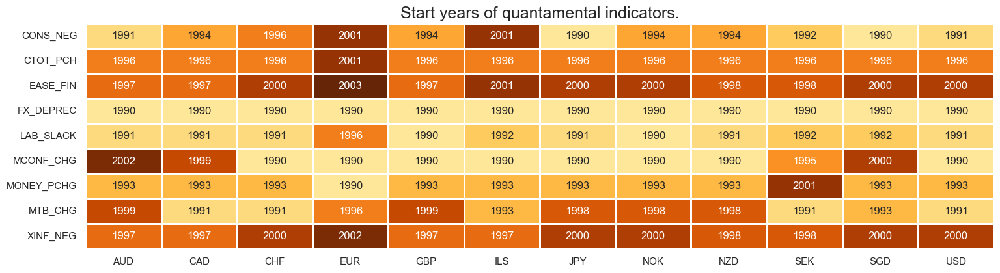

In [35]:
xcatx = [x for x in combined_macro.keys()]
msm.check_availability(dfx, xcats=xcatx, cids=cids_eqx, missing_recent=False)

In [36]:
# Set parameters
impute_missing_cids = True
min_ratio_cids = 0.5

cidx = cids_eqx
# Impute cross-sectional values if majority of cross sections are available
macro_xcatx = [x for x in combined_macro.keys()]
# Exclude categories than cannot logically be imputed
non_imputables = []
imputables = list(set(macro_xcatx) - set(non_imputables))

if impute_missing_cids:
    
    general_imputer = MeanPanelImputer(
        df=dfx,
        xcats=xcatx,
        cids=cidx,
        start="1990-01-01",
        end=dfx.real_date.max().strftime("%Y-%m-%d"),
        min_cids=round(min_ratio_cids * len(cidx)),        
        postfix="", # keeping the same category names
    )
    df_imputed = general_imputer.impute()
    dfx = msm.update_df(dfx, df_imputed)

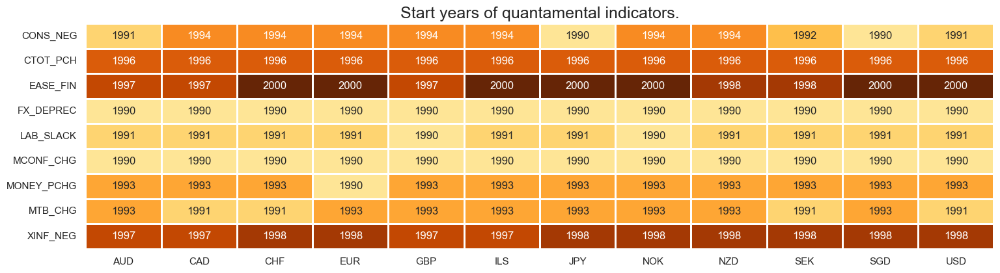

In [37]:
macro_xcatx = [x for x in combined_macro.keys()]
msm.check_availability(dfx, xcats=macro_xcatx, cids=cids_eqx, missing_recent=False)

### Standardized relative factors

In [38]:
xcatx = [x for x in combined_macro.keys()]
cidx = cids_eqx

dfa = pd.DataFrame(columns=dfx.columns)
for xcat in xcatx:
    dfaa = msp.make_relative_value(
        dfx,
        xcats=xcatx,
        cids=cidx,
        start="1990-01-01",
        rel_meth="subtract",
        postfix="vGLB",
        blacklist=None
    )  
    dfa = msm.update_df(dfa, dfaa)
    
dfx = msm.update_df(dfx, dfa)

relative_factors = list(dfa['xcat'].unique())

In [39]:
xcatx = relative_factors
cidx = cids_eqx

dfa = pd.DataFrame(columns=dfx.columns)
for xcat in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xcat,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
        blacklist=None
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

rn_factors = list(dfa['xcat'].unique())

In [40]:
# Labelling dictionary

rnf_labels = {
    "XINF_NEGvGLB_ZN": "Relative inflation shortfall",
    "LAB_SLACKvGLB_ZN": "Relative labour market slack",
    "FX_DEPRECvGLB_ZN": "Relative FX depreciation",
    "EASE_FINvGLB_ZN": "Relative real rates conditions",
    "CTOT_PCHvGLB_ZN": "Relative terms-of-trade changes",
    "MCONF_CHGvGLB_ZN": "Relative industry confidence change",
    "MTB_CHGvGLB_ZN": "Relative trade balance change",
    "MONEY_PCHGvGLB_ZN": "Relative money growth",
    "CONS_NEGvGLB_ZN": "Relative consumption shortfall",
}

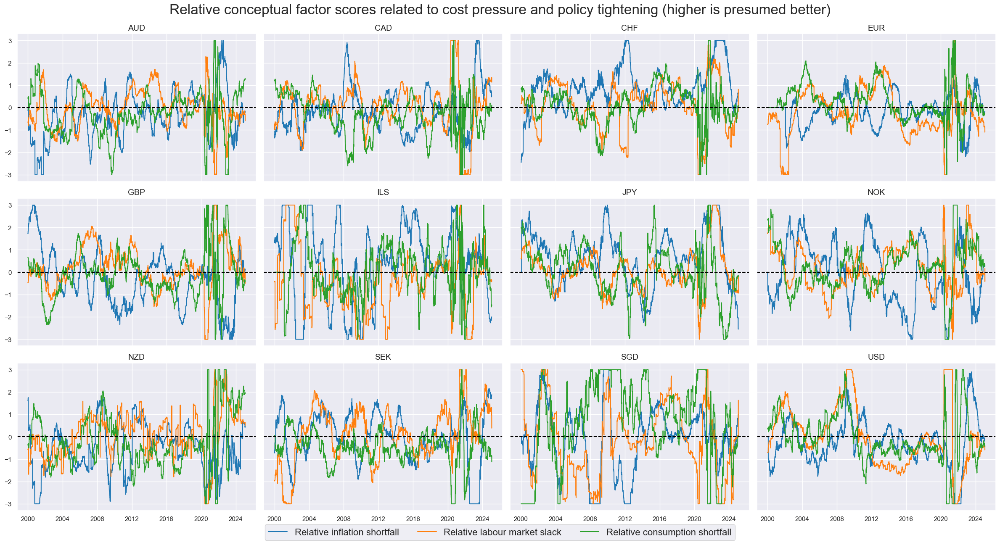

In [41]:
cidx = cids_eqx
xcatx = ["XINF_NEGvGLB_ZN", "LAB_SLACKvGLB_ZN", "CONS_NEGvGLB_ZN"]

xcatx_labels = [rnf_labels[xc] for xc in xcatx]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    xcat_labels=xcatx_labels,
    legend_fontsize=16,
    cids=cidx,
    title="Relative conceptual factor scores related to cost pressure and policy tightening (higher is presumed better)",
    title_fontsize=24,
    cumsum=False,
    ncol=4,
    same_y=True,
    aspect=1.4,
    size=(12, 7),
    all_xticks=False,
    xcat_grid=False,
)

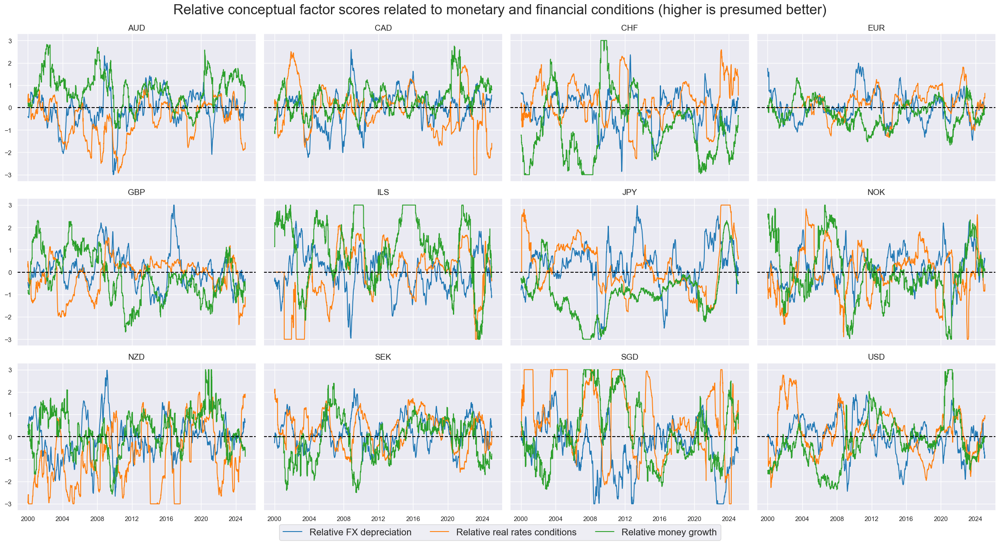

In [42]:
cidx = cids_eqx
xcatx =["FX_DEPRECvGLB_ZN", "EASE_FINvGLB_ZN", "MONEY_PCHGvGLB_ZN"]

xcatx_labels = [rnf_labels[xc] for xc in xcatx]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    xcat_labels=xcatx_labels,
    legend_fontsize=16,
    cids=cidx,
    title="Relative conceptual factor scores related to monetary and financial conditions (higher is presumed better)",
    title_fontsize=24,
    cumsum=False,
    ncol=4,
    same_y=True,
    aspect=1.4,
    size=(12, 7),
    all_xticks=False,
    xcat_grid=False,
)

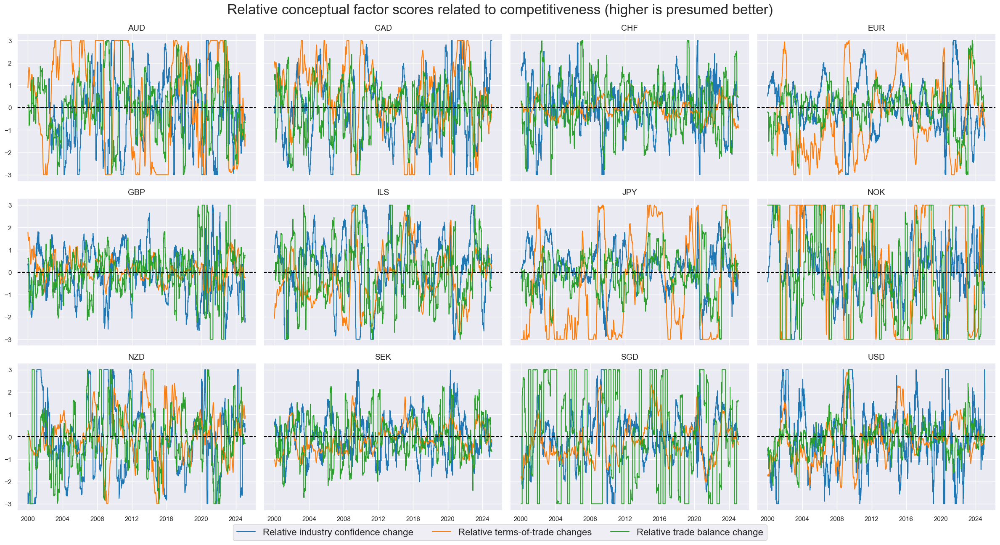

In [43]:
cidx = cids_eqx
xcatx =["MCONF_CHGvGLB_ZN", "CTOT_PCHvGLB_ZN", "MTB_CHGvGLB_ZN"]

xcatx_labels = [rnf_labels[xc] for xc in xcatx]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    xcat_labels=xcatx_labels,
    legend_fontsize=16,
    cids=cidx,
    title="Relative conceptual factor scores related to competitiveness (higher is presumed better)",
    title_fontsize=24,
    cumsum=False,
    ncol=4,
    same_y=True,
    aspect=1.4,
    size=(12, 7),
    all_xticks=False,
    xcat_grid=False,
)

### Conceptual parity signal

In [44]:
xcatx = rn_factors
cidx = cids_eqx

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat="MACROvGLB_ZN",
)
dfx = msm.update_df(dfx, dfa)

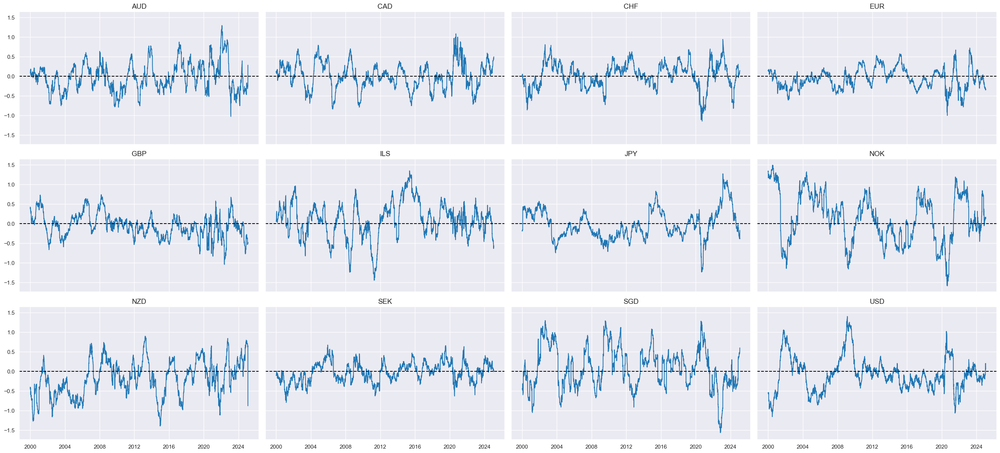

In [45]:
msp.view_timelines(
    dfx,
    xcats=["MACROvGLB_ZN"],
    cids=sorted(cidx),
    title=None,
    cumsum=False,
    ncol=4,
    same_y=True,
    size=(12, 7),
    all_xticks=False,
    xcat_grid=False,
)

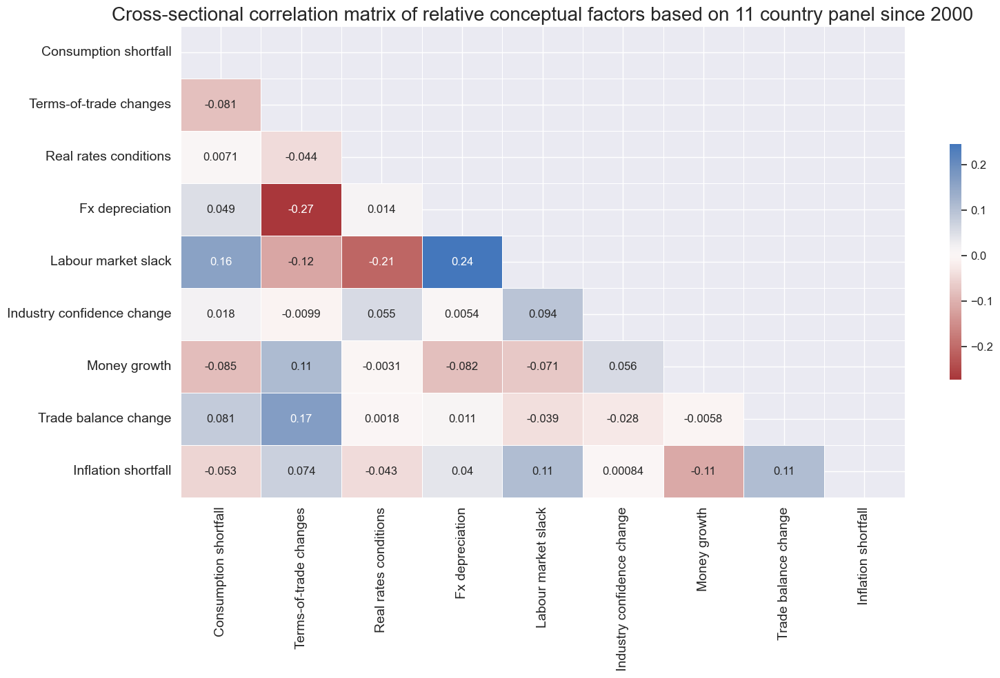

In [46]:
xcatx = rn_factors # + ["MACROvGLB_ZN"]
cidx = cids_eqx
xcatx_labels = [rnf_labels[xc][9:].capitalize() for xc in xcatx]

msp.correl_matrix(
    dfx,
    xcats=xcatx,
    xcat_labels=xcatx_labels,
    cids=cidx,
    title="Cross-sectional correlation matrix of relative conceptual factors based on 11 country panel since 2000",
    size=(16, 10),
    show=True,
    annot=True
)

### Target: Intra-sector cross-country relative returns

In [47]:
secx = secs + ["ALL"]
xcatx = [f"EQC{sec}XR_{adj}" for sec in secx for adj in ["NSA", "VT10"]]
cidx = cids_eqx

dfa = msp.make_relative_value(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="1990-01-01",
    rel_meth="subtract",
    postfix="vGLB",
)

dfx = msm.update_df(dfx, dfa)

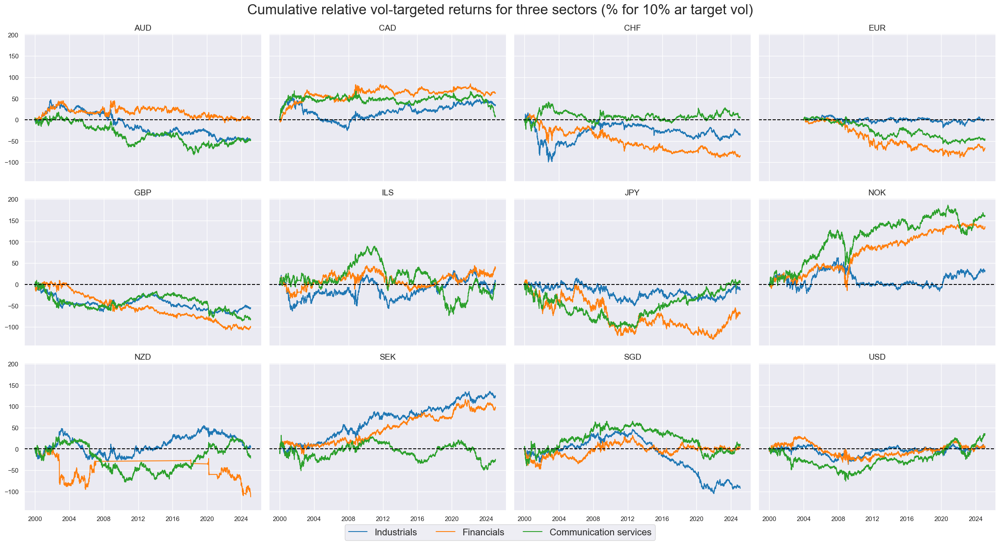

In [48]:
cidx = cids_eqx
tss = ["IND", "FIN", "CSR"]
xcatx = [f"EQC{ts}XR_NSAvGLB" for ts in tss]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    xcat_labels=[sector_labels[ts] for ts in tss],
    legend_fontsize=16,
    cids=cidx,
    title="Cumulative relative vol-targeted returns for three sectors (% for 10% ar target vol)",
    title_fontsize=24,
    cumsum=True,
    ncol=4,
    same_y=True,
    aspect=1.4,
    size=(12, 7),
    all_xticks=False,
    xcat_grid=False,
)

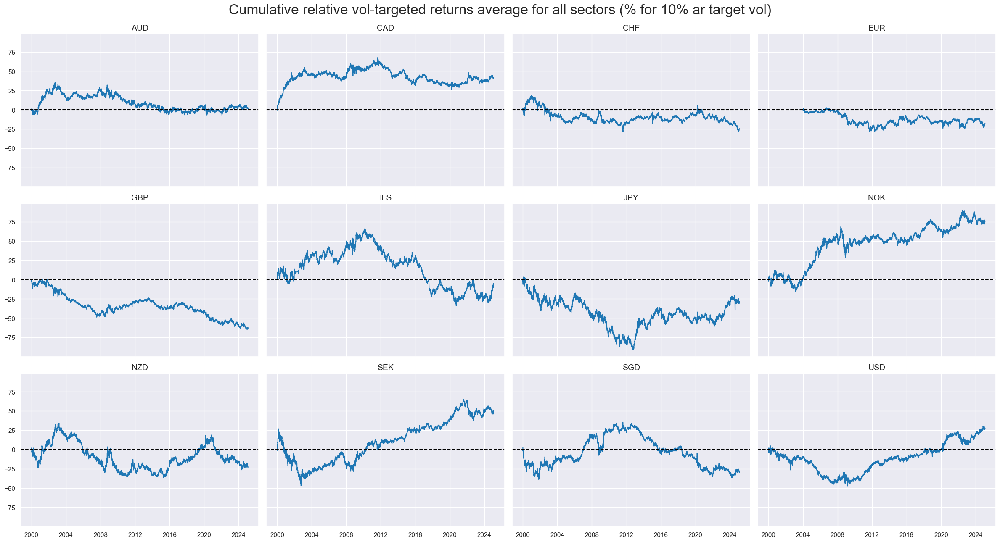

In [49]:
cidx = cids_eqx
xcatx = f"EQCALLXR_NSAvGLB"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    legend_fontsize=16,
    cids=cidx,
    title="Cumulative relative vol-targeted returns average for all sectors (% for 10% ar target vol)",
    title_fontsize=24,
    cumsum=True,
    ncol=4,
    same_y=True,
    aspect=1.4,
    size=(12, 7),
    all_xticks=False,
    xcat_grid=False,
)

### Sectoral return blacklisting

Blacklisting is relevant when constructing the relative performance of sectoral indices across countries.

In [50]:
sector_blacklist = {}
for sec in secs:
    dfb = dfx[dfx["xcat"] == f"EQC{sec}UNTRADABLE_NSA"].loc[:, ["cid", "xcat", "real_date", "value"]]
    dfba = (
        dfb.groupby(["cid", "real_date"])
        .aggregate(value=pd.NamedAgg(column="value", aggfunc="max"))
        .reset_index()
    )
    dfba["xcat"] = f"EQC{sec}BLACK"
    
    sector_blacklist[sec] = msp.make_blacklist(dfba, f"EQC{sec}BLACK")

## Value checks

### Statistical learning parameters

In [51]:
default_target_type = "XR_VT10vGLB" 

default_learn_config = {
    "scorer": {"negmse": make_scorer(mean_squared_error, greater_is_better=False)}, 
    "splitter": {"Expanding": msl.ExpandingKFoldPanelSplit(n_splits=3)},
     # retraining interval in months
    "test_size": 3,
    # minimum number of cids to start predicting
    "min_cids": 2,
    # minimum number of periods to start predicting
    "min_periods": 24,
    "split_functions": {"Expanding": lambda n: n // 24}
}

In [52]:
# List of dictionaries for two learning pipelines

learning_models = [
    {
        "ols": Pipeline(
          [
              ("predictor", msl.ModifiedLinearRegression(method = "analytic", fit_intercept=False)),
          ]
        ),
        "twls": Pipeline(
          [
              ("predictor", msl.ModifiedTimeWeightedLinearRegression(method = "analytic", fit_intercept=False)),
          ]
        ),        
    },
]


# Hyperparameter grid   
learning_grid = [
    {
        "ols": {
            "predictor__positive": [True, False],
        },
        "twls": {
           "predictor__positive": [True, False],
           "predictor__half_life": [12, 24, 36, 60],
        },

    },
]

# list of tuples containg both the model specification and the corresponding hyperparameter grid search
model_and_grids = list(zip(learning_models, learning_grid))

In [53]:
# Wrapper to avoid repetitive code below

def run_single_signal_optimizer(
    df: pd.DataFrame,
    xcats: list,
    cids: list,
    blacklist,
    signal_freq: str,
    signal_name: str,
    models: dict,
    hyperparameters: dict,
    learning_config: dict,
) -> tuple:
    """
    Wrapping function around msl.SignalOptimizer for a given set of models and hyperparameters
    
    """
    assert set(models.keys()) == set(hyperparameters.keys()), "The provided pair of model and grid names do not match."
    
    required_config = ["scorer", "splitter", "test_size", "min_cids", "min_periods", "split_functions"]
    assert all([learning_config.get(x, None) is not None for x in required_config])

    so = msl.SignalOptimizer(
        df=df,
        xcats=xcats,
        cids=cids,
        blacklist=blacklist,
        freq=signal_freq,
        lag=1,
        xcat_aggs=["last", "sum"],
    )
    so.calculate_predictions(
        name=signal_name,
        models=models,
        scorers=learning_config.get("scorer"),
        hyperparameters=hyperparameters,
        inner_splitters=learning_config.get("splitter"),
        test_size=learning_config.get("test_size"),
        min_cids=learning_config.get("min_cids"), 
        min_periods=learning_config.get("min_periods"),
        n_jobs_outer=-1,
        split_functions=learning_config.get("split_functions"),
    )
    # cleanup
    gc.collect()

    return so    

### PnL generation parameters

In [54]:
default_start_date = "2003-01-31"  # start date for the PnL analysis

### Sector average

#### Specify analysis

In [55]:
sector = "ALL"

all_dict = {
    "sec": sector,
    "name": sector_labels[sector],
    "factors": rn_factors,
    "cidx": cids_eqx,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": None,
    "models": None,
    "signals": None,
    "catregs": None,
    "pnls": None,
}

#### General learning models and signals

In [56]:
dix = all_dict

sec = dix["sec"]
factors = dix["factors"]
ret = dix["ret"]
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]

trained_models = {}
for pair in model_and_grids:
    
    model, grid = pair
    
    opt_pipeline_name = '-'.join(list(model.keys()))
    signal_name = opt_pipeline_name.upper() + sec.upper()
    
    print(
        f"Running the signal learning for {opt_pipeline_name} over {sec} returns."
    )
    
    trained_models[signal_name] = run_single_signal_optimizer(
        df=dfx,
        xcats=factors + [ret],
        cids=cidx,
        blacklist=blax,
        signal_freq=freq,
        signal_name=signal_name,
        models=model,
        hyperparameters=grid,
        learning_config=default_learn_config,
    )
    
    dfa = trained_models[signal_name].get_optimized_signals()
    dfx = msm.update_df(dfx, dfa)

dix["models"] = trained_models.values()
dix["signals"] = ["MACROvGLB_ZN"] + list(trained_models.keys())

Running the signal learning for ols-twls over ALL returns.


  0%|          | 0/104 [00:00<?, ?it/s]

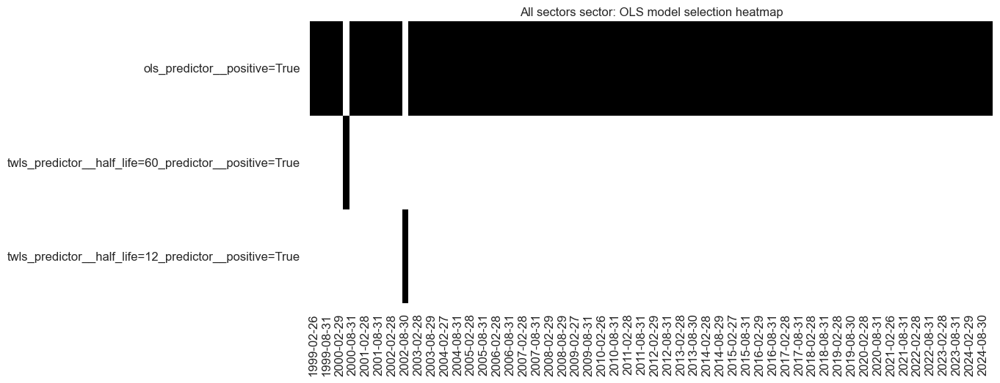

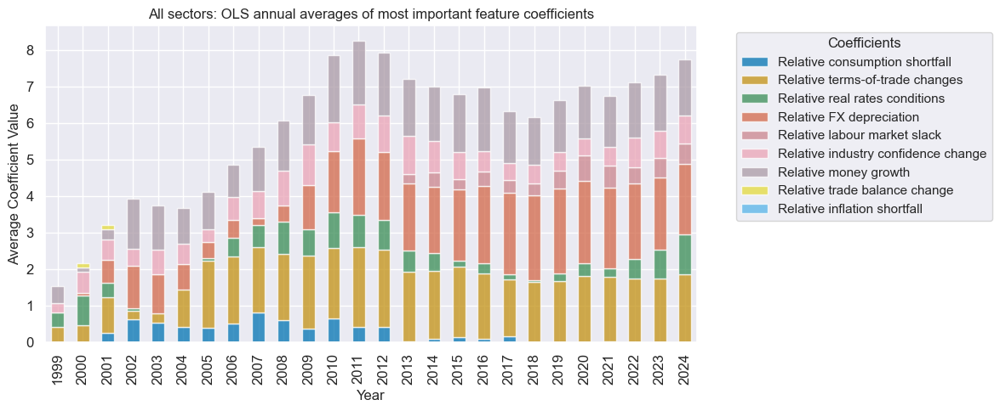

In [57]:
dix = all_dict

sec = dix["sec"]
trained_models = list(dix["models"])
sigx = dix["signals"][-1]

trained_models[0].models_heatmap(
    sigx,
    cap=10,
    figsize=(12, 5),
    title=f"{sector_labels[sec.upper()]} sector: OLS model selection heatmap",
)

trained_models[0].coefs_stackedbarplot(
    name=sigx,
    figsize=(12, 5),
    ftrs_renamed=rnf_labels,
    title=f"{sector_labels[sec.upper()]}: OLS annual averages of most important feature coefficients",
)

#### Signal quality check

In [58]:
dix = all_dict

cidx = dix["cidx"]
sec = dix["name"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

catregs = {
    x: msp.CategoryRelations(
        df=dfx,
        xcats=[x, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        blacklist=blax,
        xcat_aggs=["last", "sum"],
        slip=1,
    )
    for x in sigs
}

dix["catregs"] = catregs

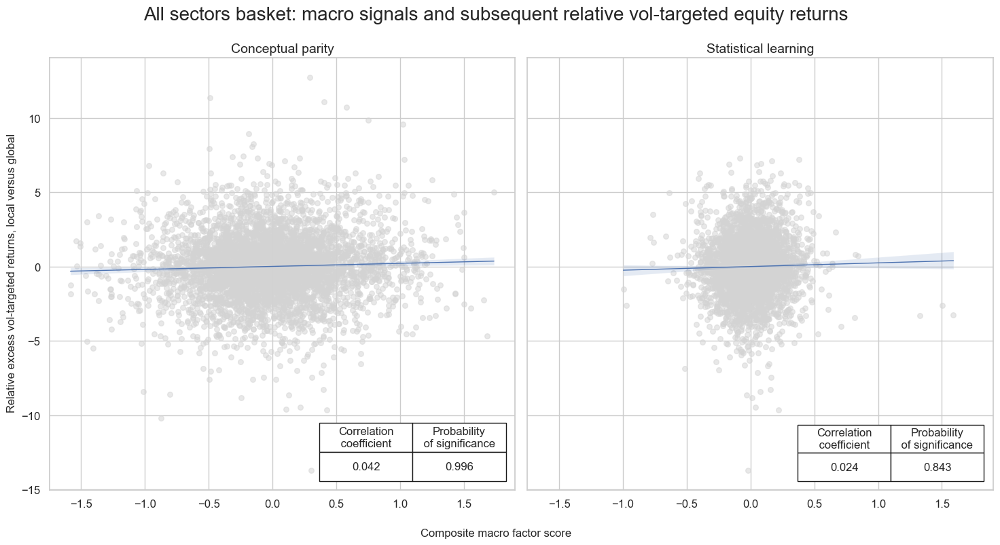

In [59]:
dix = all_dict
catregs = dix["catregs"]
sigs = dix["signals"]
name = dix["name"]

msv.multiple_reg_scatter(
    cat_rels=list(catregs.values()),
    ncol=2,
    nrow=1,
    figsize=(15, 8),
    title=f"{name} basket: macro signals and subsequent relative vol-targeted equity returns",
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab="Composite macro factor score",
    ylab="Relative excess vol-targeted returns, local versus global",
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=["Conceptual parity", "Statistical learning"],
)

#### Naive PnL

In [60]:
dix = all_dict

cidx = dix["cidx"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

pnl = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=default_start_date,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN",
    )

dix["pnls"] = pnl

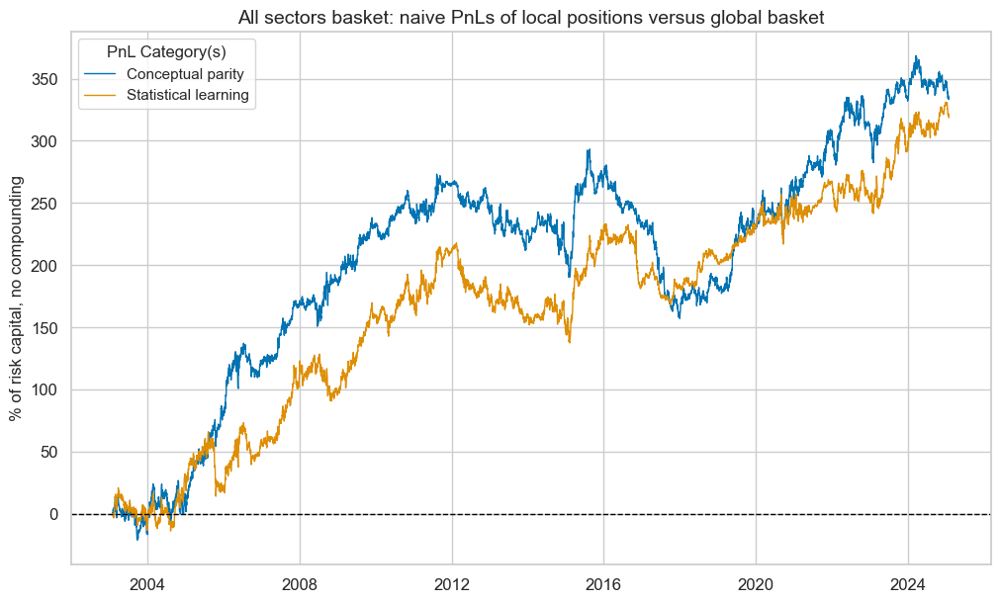

xcat,PNL_MACROvGLB_ZNALL_PZN,PNL_OLS-TWLSALL_PZN
Return %,15.151188,14.479798
St. Dev. %,40.172773,36.798534
Sharpe Ratio,0.377151,0.393488
Sortino Ratio,0.538248,0.562001
Max 21-Day Draw %,-29.799572,-44.870463
Max 6-Month Draw %,-68.087349,-46.752767
Peak to Trough Draw %,-136.306878,-80.445944
Top 5% Monthly PnL Share,0.893698,0.762921
USD_EQXR_NSA correl,-0.027813,-0.010498
Traded Months,265,265


In [61]:
dix = all_dict

pnl = dix["pnls"]
name = dix["name"]
sigs = dix["signals"]
pns = [f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN" for sig in sigs]

pnl.plot_pnls(
    pnl_cats=pnl.pnl_names,
    title=f"{name} basket: naive PnLs of local positions versus global basket",
    xcat_labels=["Conceptual parity", "Statistical learning"],
    title_fontsize=14
)

display(pnl.evaluate_pnls(pnl_cats=pnl.pnl_names))



### Energy sector

#### Specify analysis

In [62]:
sector = "ENR"

enr_dict = {
    "sec": sector,
    "name": sector_labels[sector],
    "factors": rn_factors,
    "cidx": list(set(cids_eqx) - {"CHF"}),
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "models": None,
    "signals": None,
    "catregs": None,
    "pnls": None,
}

#### General learning models and signals

In [63]:
dix = enr_dict

sec = dix["sec"]
factors = dix["factors"]
ret = dix["ret"]
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]

trained_models = {}
for pair in model_and_grids:
    
    model, grid = pair
    
    opt_pipeline_name = '-'.join(list(model.keys()))
    signal_name = opt_pipeline_name.upper() + sec.upper()
    
    print(
        f"Running the signal learning for {opt_pipeline_name} over {sec} returns."
    )
    
    trained_models[signal_name] = run_single_signal_optimizer(
        df=dfx,
        xcats=factors + [ret],
        cids=cidx,
        blacklist=blax,
        signal_freq=freq,
        signal_name=signal_name,
        models=model,
        hyperparameters=grid,
        learning_config=default_learn_config,
    )
    
    dfa = trained_models[signal_name].get_optimized_signals()
    dfx = msm.update_df(dfx, dfa)

dix["models"] = trained_models.values()
dix["signals"] = ["MACROvGLB_ZN"] + list(trained_models.keys())

Running the signal learning for ols-twls over ENR returns.


  0%|          | 0/104 [00:00<?, ?it/s]

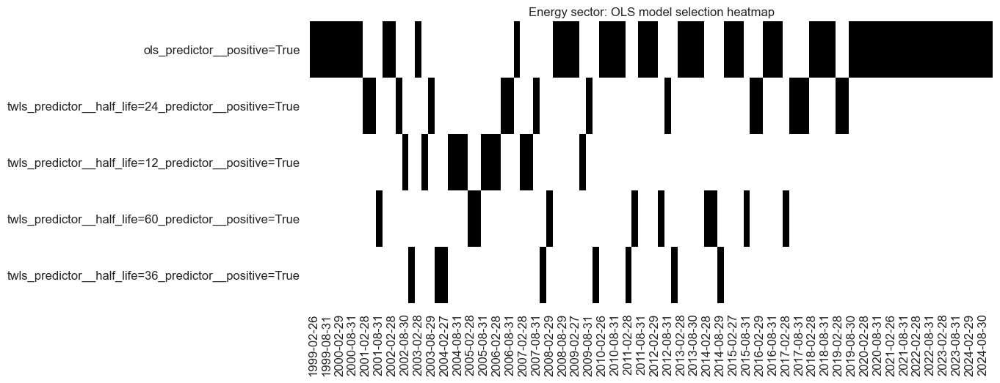

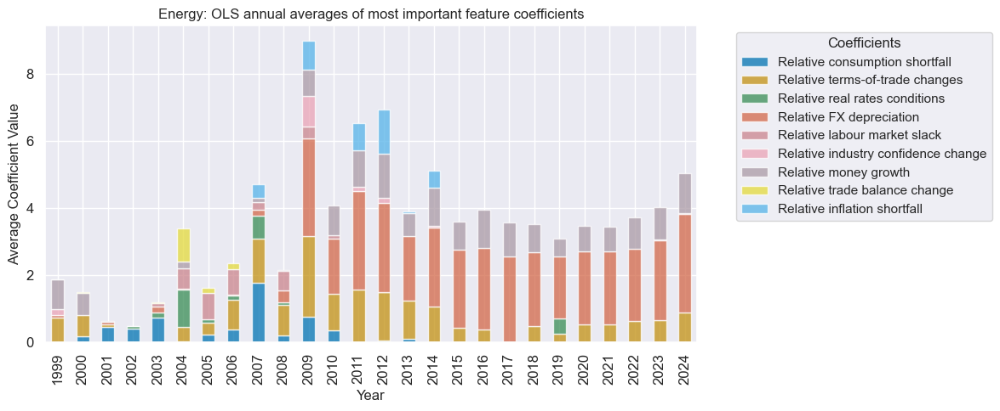

In [64]:
dix = enr_dict

sec = dix["sec"]
trained_models = list(dix["models"])
sigx = dix["signals"][-1]

trained_models[0].models_heatmap(
    sigx,
    cap=10,
    figsize=(12, 5),
    title=f"{sector_labels[sec.upper()]} sector: OLS model selection heatmap",
)

trained_models[0].coefs_stackedbarplot(
    name=sigx,
    figsize=(12, 5),
    ftrs_renamed=rnf_labels,
    title=f"{sector_labels[sec.upper()]}: OLS annual averages of most important feature coefficients",
)

#### Signal quality check

In [65]:
dix = enr_dict

cidx = dix["cidx"]
sec = dix["name"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

catregs = {
    x: msp.CategoryRelations(
        df=dfx,
        xcats=[x, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        blacklist=blax,
        xcat_aggs=["last", "sum"],
        slip=1,
    )
    for x in sigs
}

dix["catregs"] = catregs

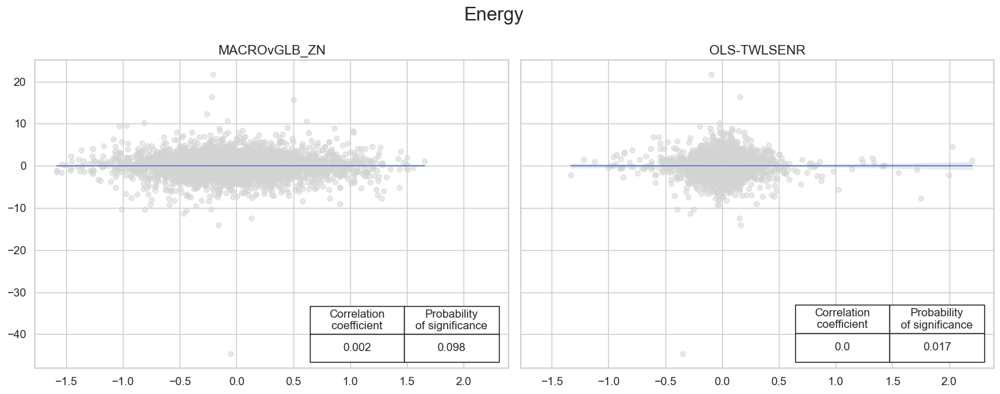

In [66]:
dix = enr_dict
catregs = dix["catregs"]
sigs = dix["signals"]
name = dix["name"]

msv.multiple_reg_scatter(
    cat_rels=list(catregs.values()),
    ncol=2,
    nrow=1,
    figsize=(15, 6),
    title=name,
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab=None,
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=list(sigs),
)

#### Naive PnL

In [67]:
dix = enr_dict

cidx = dix["cidx"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

pnl = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=default_start_date,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN",
    )

dix["pnls"] = pnl

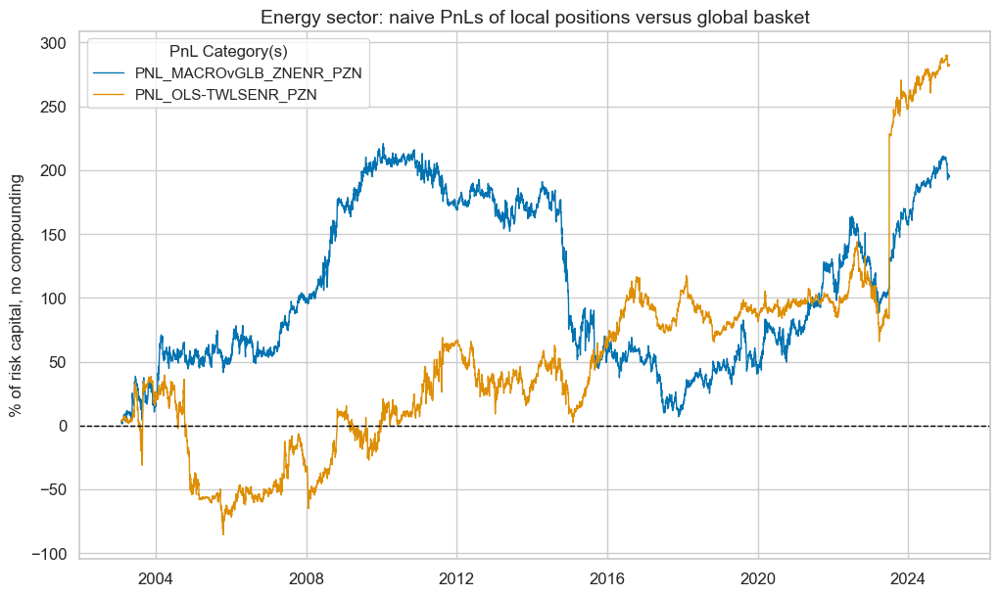

xcat,PNL_MACROvGLB_ZNENR_PZN,PNL_OLS-TWLSENR_PZN
Return %,8.834337,12.810447
St. Dev. %,41.684364,48.81694
Sharpe Ratio,0.211934,0.262418
Sortino Ratio,0.297712,0.474998
Max 21-Day Draw %,-56.539402,-49.12031
Max 6-Month Draw %,-117.875864,-93.577881
Peak to Trough Draw %,-213.97104,-124.987546
Top 5% Monthly PnL Share,1.575094,1.319973
USD_EQXR_NSA correl,-0.001983,0.075431
Traded Months,265,265


In [68]:
dix = enr_dict

pnl = dix["pnls"]
name = dix["name"]
sigs = dix["signals"]
pns = [f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN" for sig in sigs]

pnl.plot_pnls(
    pnl_cats=pnl.pnl_names,
    title=f"{name} sector: naive PnLs of local positions versus global basket",
    title_fontsize=14
)

display(pnl.evaluate_pnls(pnl_cats=pnl.pnl_names))

### Materials sector

#### Specify analysis

In [69]:
sector = "MAT"

mat_dict = {
    "sec": sector,
    "name": sector_labels[sector],
    "factors": rn_factors,
    "cidx": cids_eqx,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "models": None,
    "signals": None,
    "catregs": None,
    "pnls": None,
}

#### General learning models and signals

In [70]:
dix = mat_dict

sec = dix["sec"]
factors = dix["factors"]
ret = dix["ret"]
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]

trained_models = {}
for pair in model_and_grids:
    
    model, grid = pair
    
    opt_pipeline_name = '-'.join(list(model.keys()))
    signal_name = opt_pipeline_name.upper() + sec.upper()
    
    print(
        f"Running the signal learning for {opt_pipeline_name} over {sec} returns."
    )
    
    trained_models[signal_name] = run_single_signal_optimizer(
        df=dfx,
        xcats=factors + [ret],
        cids=cidx,
        blacklist=blax,
        signal_freq=freq,
        signal_name=signal_name,
        models=model,
        hyperparameters=grid,
        learning_config=default_learn_config,
    )
    
    dfa = trained_models[signal_name].get_optimized_signals()
    dfx = msm.update_df(dfx, dfa)

dix["models"] = trained_models.values()
dix["signals"] = ["MACROvGLB_ZN"] + list(trained_models.keys())

Running the signal learning for ols-twls over MAT returns.


  0%|          | 0/104 [00:00<?, ?it/s]

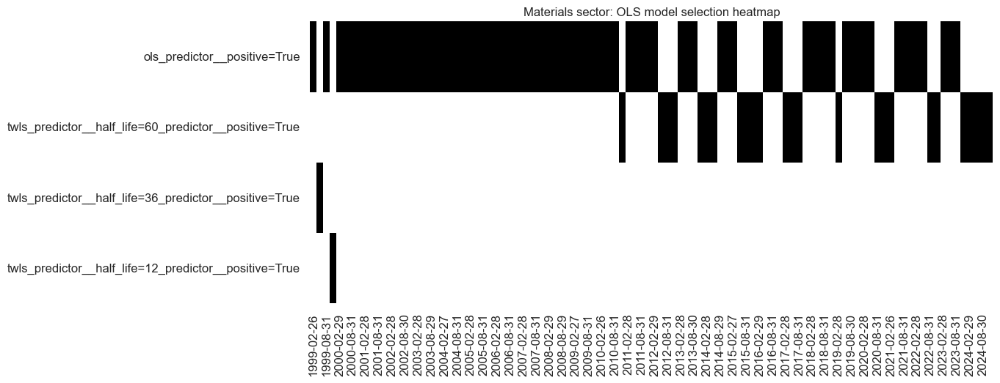

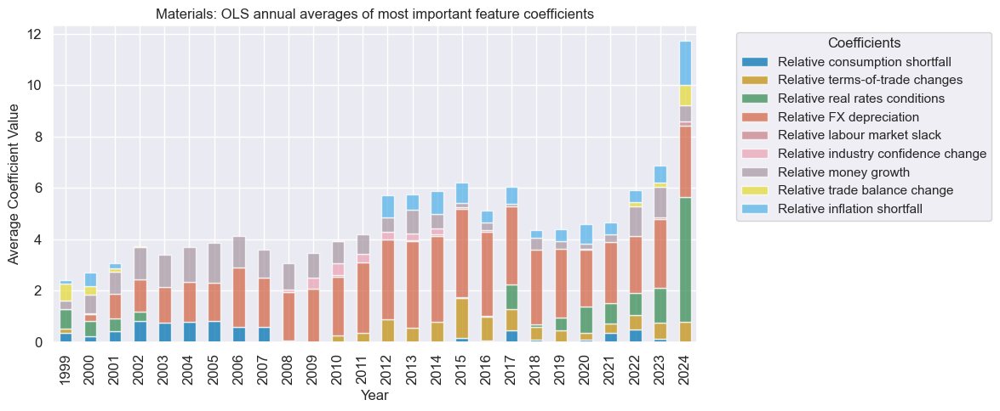

In [71]:
dix = mat_dict

sec = dix["sec"]
trained_models = list(dix["models"])
sigx = dix["signals"][-1]

trained_models[0].models_heatmap(
    sigx,
    cap=10,
    figsize=(12, 5),
    title=f"{sector_labels[sec.upper()]} sector: OLS model selection heatmap",
)

trained_models[0].coefs_stackedbarplot(
    name=sigx,
    figsize=(12, 5),
    ftrs_renamed=rnf_labels,
    title=f"{sector_labels[sec.upper()]}: OLS annual averages of most important feature coefficients",
)

#### Signal quality check

In [72]:
dix = mat_dict

cidx = dix["cidx"]
sec = dix["name"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

catregs = {
    x: msp.CategoryRelations(
        df=dfx,
        xcats=[x, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        blacklist=blax,
        xcat_aggs=["last", "sum"],
        slip=1,
    )
    for x in sigs
}

dix["catregs"] = catregs

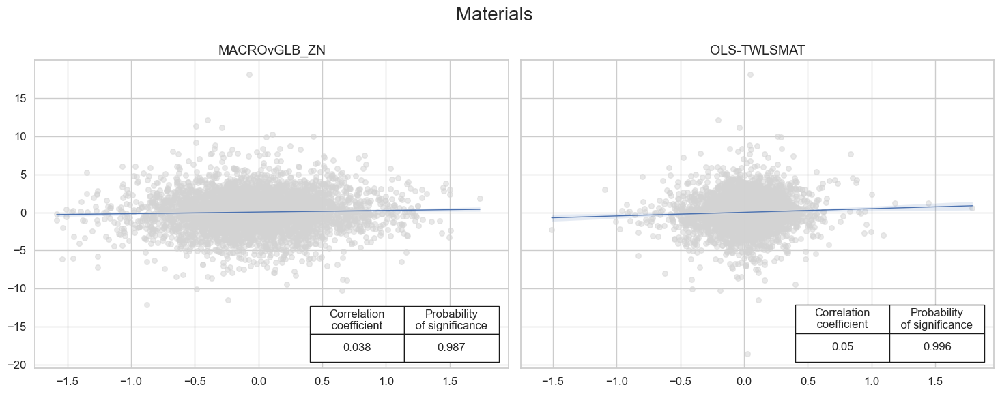

In [73]:
dix = mat_dict
catregs = dix["catregs"]
sigs = dix["signals"]
name = dix["name"]

msv.multiple_reg_scatter(
    cat_rels=list(catregs.values()),
    ncol=2,
    nrow=1,
    figsize=(15, 6),
    title=name,
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab=None,
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=list(sigs),
)

#### Naive PnL

In [74]:
dix = mat_dict

cidx = dix["cidx"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

pnl = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=default_start_date,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN",
    )

dix["pnls"] = pnl

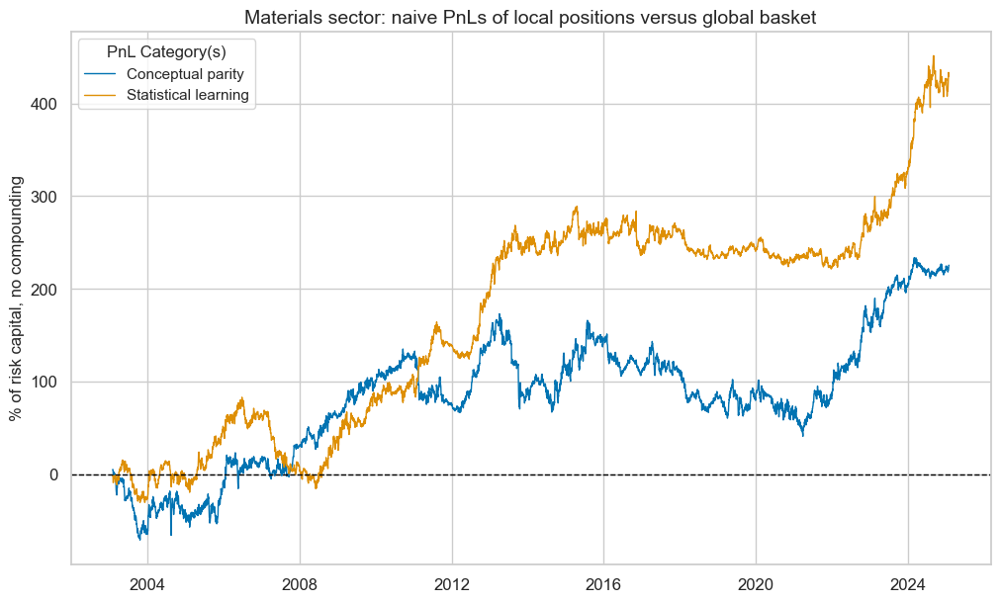

xcat,PNL_MACROvGLB_ZNMAT_PZN,PNL_OLS-TWLSMAT_PZN
Return %,10.24395,19.526475
St. Dev. %,41.869268,38.36843
Sharpe Ratio,0.244665,0.50892
Sortino Ratio,0.348932,0.739585
Max 21-Day Draw %,-49.067517,-38.865771
Max 6-Month Draw %,-95.421839,-60.112409
Peak to Trough Draw %,-132.206322,-98.654246
Top 5% Monthly PnL Share,1.385826,0.718693
USD_EQXR_NSA correl,-0.020431,-0.033101
Traded Months,265,265


In [75]:
dix = mat_dict

pnl = dix["pnls"]
name = dix["name"]
sigs = dix["signals"]
pns = [f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN" for sig in sigs]

pnl.plot_pnls(
    pnl_cats=pnl.pnl_names,
    title=f"{name} sector: naive PnLs of local positions versus global basket",
    xcat_labels=["Conceptual parity", "Statistical learning"],
    title_fontsize=14
)

display(pnl.evaluate_pnls(pnl_cats=pnl.pnl_names))


### Industrials sector

#### Specify analysis

In [76]:
sector = "IND"

ind_dict = {
    "sec": sector,
    "name": sector_labels[sector],
    "factors": rn_factors,
    "cidx": cids_eqx,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "models": None,
    "signals": None,
    "catregs": None,
    "pnls": None,
}

#### General learning models and signals

In [77]:
dix = ind_dict

sec = dix["sec"]
factors = dix["factors"]
ret = dix["ret"]
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]

trained_models = {}
for pair in model_and_grids:
    
    model, grid = pair
    
    opt_pipeline_name = '-'.join(list(model.keys()))
    signal_name = opt_pipeline_name.upper() + sec.upper()
    
    print(
        f"Running the signal learning for {opt_pipeline_name} over {sec} returns."
    )
    
    trained_models[signal_name] = run_single_signal_optimizer(
        df=dfx,
        xcats=factors + [ret],
        cids=cidx,
        blacklist=blax,
        signal_freq=freq,
        signal_name=signal_name,
        models=model,
        hyperparameters=grid,
        learning_config=default_learn_config,
    )
    
    dfa = trained_models[signal_name].get_optimized_signals()
    dfx = msm.update_df(dfx, dfa)

dix["models"] = trained_models.values()
dix["signals"] = ["MACROvGLB_ZN"] + list(trained_models.keys())

Running the signal learning for ols-twls over IND returns.


  0%|          | 0/104 [00:00<?, ?it/s]

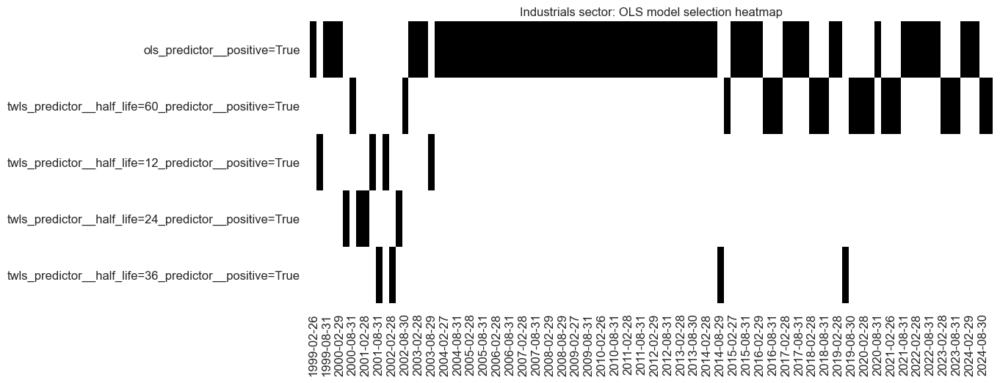

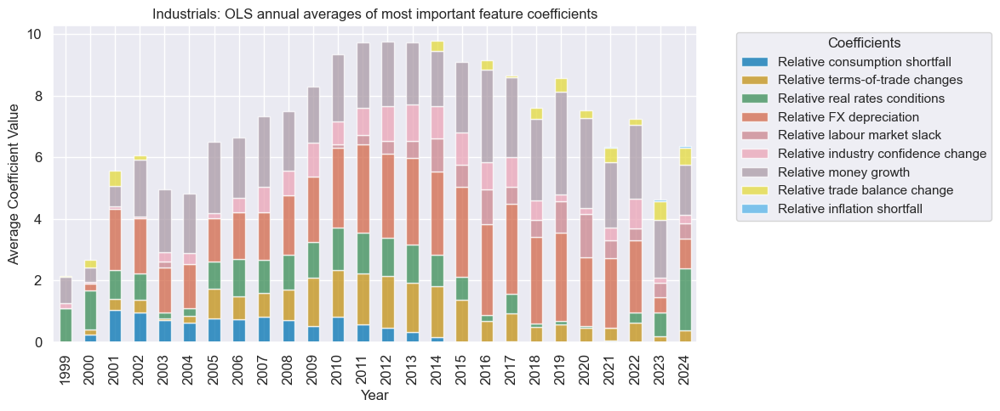

In [78]:
dix = ind_dict

sec = dix["sec"]
trained_models = list(dix["models"])
sigx = dix["signals"][-1]

trained_models[0].models_heatmap(
    sigx,
    cap=10,
    figsize=(12, 5),
    title=f"{sector_labels[sec.upper()]} sector: OLS model selection heatmap",
)

trained_models[0].coefs_stackedbarplot(
    name=sigx,
    figsize=(12, 5),
    ftrs_renamed=rnf_labels,
    title=f"{sector_labels[sec.upper()]}: OLS annual averages of most important feature coefficients",
)

#### Signal quality check

In [79]:
dix = ind_dict

cidx = dix["cidx"]
sec = dix["name"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

catregs = {
    x: msp.CategoryRelations(
        df=dfx,
        xcats=[x, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        blacklist=blax,
        xcat_aggs=["last", "sum"],
        slip=1,
    )
    for x in sigs
}

dix["catregs"] = catregs

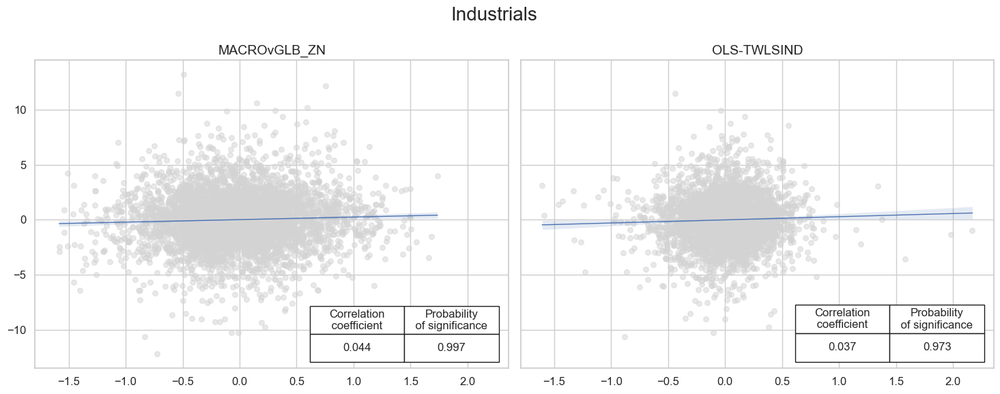

In [80]:
dix = ind_dict
catregs = dix["catregs"]
sigs = dix["signals"]
name = dix["name"]

msv.multiple_reg_scatter(
    cat_rels=list(catregs.values()),
    ncol=2,
    nrow=1,
    figsize=(15, 6),
    title=name,
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab=None,
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=list(sigs),
)

#### Naive PnL

In [81]:
dix = ind_dict

cidx = dix["cidx"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

pnl = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=default_start_date,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN",
    )

dix["pnls"] = pnl

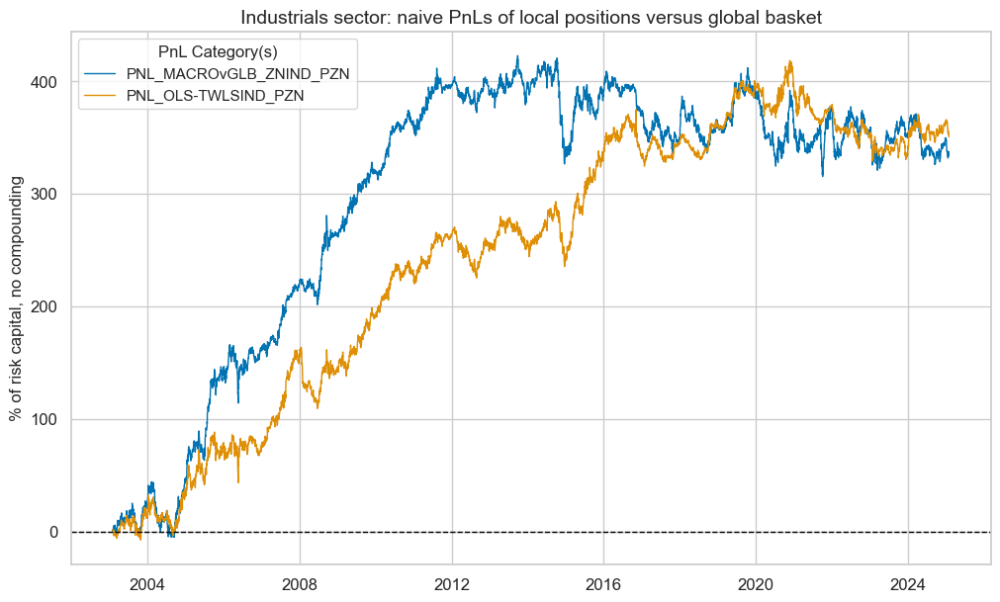

xcat,PNL_MACROvGLB_ZNIND_PZN,PNL_OLS-TWLSIND_PZN
Return %,15.154808,15.929084
St. Dev. %,41.853062,36.490006
Sharpe Ratio,0.362096,0.436533
Sortino Ratio,0.520089,0.633252
Max 21-Day Draw %,-57.793653,-34.488873
Max 6-Month Draw %,-79.900085,-47.086204
Peak to Trough Draw %,-107.366211,-89.369337
Top 5% Monthly PnL Share,1.033481,0.779576
USD_EQXR_NSA correl,-0.004865,0.001896
Traded Months,265,265


In [82]:
dix = ind_dict

pnl = dix["pnls"]
name = dix["name"]
sigs = dix["signals"]
pns = [f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN" for sig in sigs]

pnl.plot_pnls(
    pnl_cats=pnl.pnl_names,
    title=f"{name} sector: naive PnLs of local positions versus global basket",
    title_fontsize=14
)

display(pnl.evaluate_pnls(pnl_cats=pnl.pnl_names))

### Consumer discretionary sector

#### Specify analysis

In [83]:
sector = "COD"

cod_dict = {
    "sec": sector,
    "name": sector_labels[sector],
    "factors": rn_factors,
    "cidx": cids_eqx,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "models": None,
    "signals": None,
    "catregs": None,
    "pnls": None,
}

#### General learning models and signals

In [84]:
dix = cod_dict

sec = dix["sec"]
factors = dix["factors"]
ret = dix["ret"]
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]

trained_models = {}
for pair in model_and_grids:
    
    model, grid = pair
    
    opt_pipeline_name = '-'.join(list(model.keys()))
    signal_name = opt_pipeline_name.upper() + sec.upper()
    
    print(
        f"Running the signal learning for {opt_pipeline_name} over {sec} returns."
    )
    
    trained_models[signal_name] = run_single_signal_optimizer(
        df=dfx,
        xcats=factors + [ret],
        cids=cidx,
        blacklist=blax,
        signal_freq=freq,
        signal_name=signal_name,
        models=model,
        hyperparameters=grid,
        learning_config=default_learn_config,
    )
    
    dfa = trained_models[signal_name].get_optimized_signals()
    dfx = msm.update_df(dfx, dfa)

dix["models"] = trained_models.values()
dix["signals"] = ["MACROvGLB_ZN"] + list(trained_models.keys())

Running the signal learning for ols-twls over COD returns.


  0%|          | 0/104 [00:00<?, ?it/s]

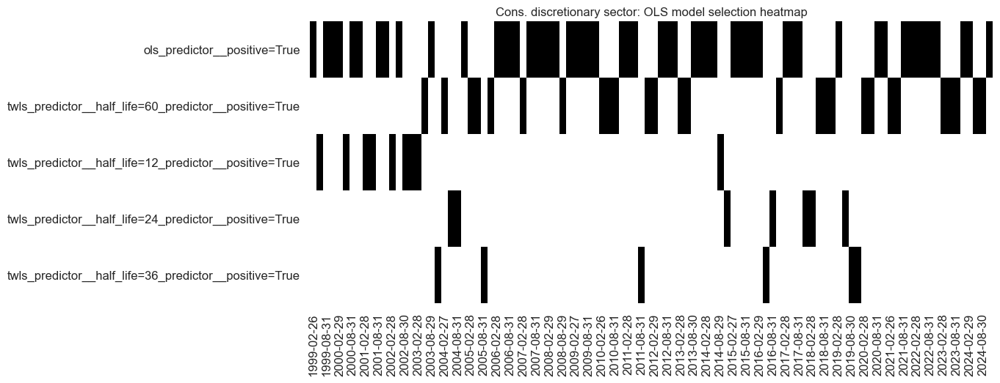

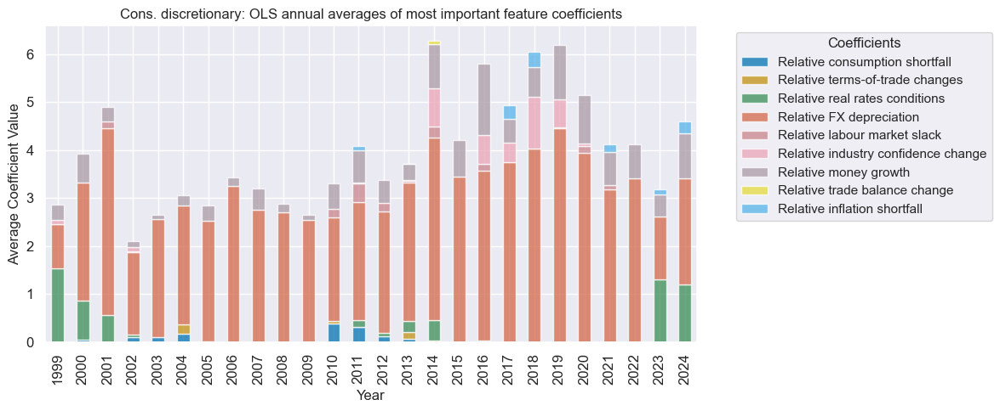

In [85]:
dix = cod_dict

sec = dix["sec"]
trained_models = list(dix["models"])
sigx = dix["signals"][-1]

trained_models[0].models_heatmap(
    sigx,
    cap=10,
    figsize=(12, 5),
    title=f"{sector_labels[sec.upper()]} sector: OLS model selection heatmap",
)

trained_models[0].coefs_stackedbarplot(
    name=sigx,
    figsize=(12, 5),
    ftrs_renamed=rnf_labels,
    title=f"{sector_labels[sec.upper()]}: OLS annual averages of most important feature coefficients",
)

#### Signal quality check

In [86]:
dix = cod_dict

cidx = dix["cidx"]
sec = dix["name"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

catregs = {
    x: msp.CategoryRelations(
        df=dfx,
        xcats=[x, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        blacklist=blax,
        xcat_aggs=["last", "sum"],
        slip=1,
    )
    for x in sigs
}

dix["catregs"] = catregs

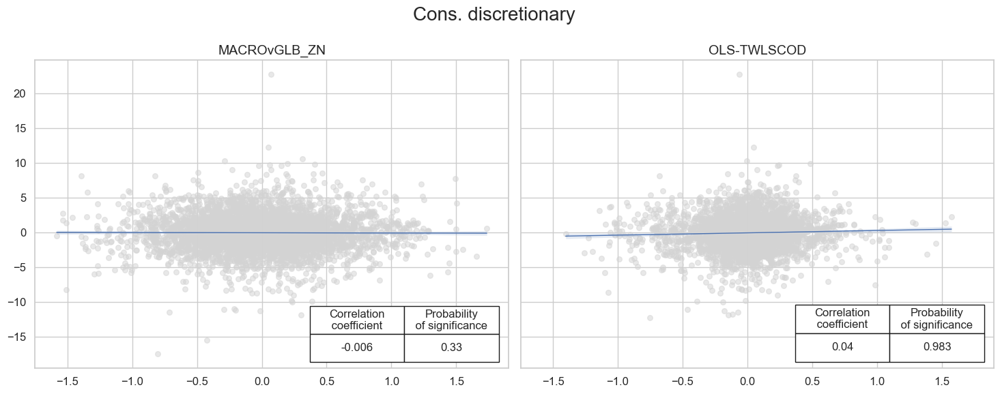

In [87]:
dix = cod_dict
catregs = dix["catregs"]
sigs = dix["signals"]
name = dix["name"]

msv.multiple_reg_scatter(
    cat_rels=list(catregs.values()),
    ncol=2,
    nrow=1,
    figsize=(15, 6),
    title=name,
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab=None,
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=list(sigs),
)


#### Naive PnL

In [88]:
dix = cod_dict

cidx = dix["cidx"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

pnl = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=default_start_date,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN",
    )

dix["pnls"] = pnl

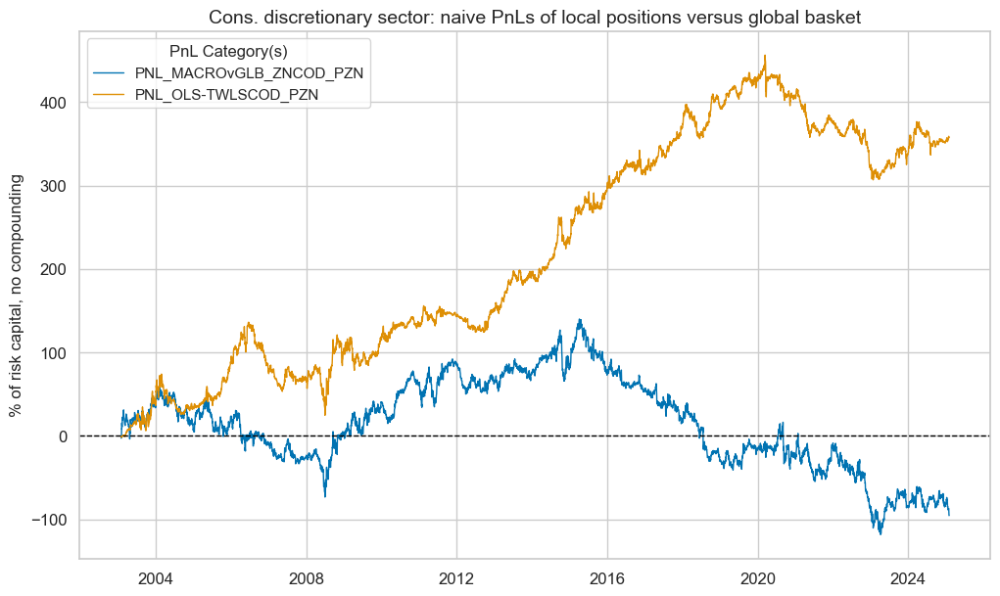

xcat,PNL_MACROvGLB_ZNCOD_PZN,PNL_OLS-TWLSCOD_PZN
Return %,-4.332585,16.24923
St. Dev. %,43.626641,36.810808
Sharpe Ratio,-0.099311,0.441426
Sortino Ratio,-0.138838,0.629187
Max 21-Day Draw %,-52.519267,-37.915066
Max 6-Month Draw %,-74.549154,-67.471157
Peak to Trough Draw %,-258.391323,-149.48593
Top 5% Monthly PnL Share,-3.445651,0.875609
USD_EQXR_NSA correl,-0.033249,-0.011909
Traded Months,265,265


In [89]:
dix = cod_dict

pnl = dix["pnls"]
name = dix["name"]
sigs = dix["signals"]
pns = [f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN" for sig in sigs]

pnl.plot_pnls(
    pnl_cats=pnl.pnl_names,
    title=f"{name} sector: naive PnLs of local positions versus global basket",
    title_fontsize=14
)

display(pnl.evaluate_pnls(pnl_cats=pnl.pnl_names))

### Consumer staples sector

#### Specify analysis

In [90]:
sector = "COS"

cos_dict = {
    "sec": sector,
    "name": sector_labels[sector],
    "factors": rn_factors,
    "cidx": cids_eqx,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "models": None,
    "signals": None,
    "catregs": None,
    "pnls": None,
}

#### General learning models and signals

In [91]:
dix = cos_dict

sec = dix["sec"]
factors = dix["factors"]
ret = dix["ret"]
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]

trained_models = {}
for pair in model_and_grids:
    
    model, grid = pair
    
    opt_pipeline_name = '-'.join(list(model.keys()))
    signal_name = opt_pipeline_name.upper() + sec.upper()
    
    print(
        f"Running the signal learning for {opt_pipeline_name} over {sec} returns."
    )
    
    trained_models[signal_name] = run_single_signal_optimizer(
        df=dfx,
        xcats=factors + [ret],
        cids=cidx,
        blacklist=blax,
        signal_freq=freq,
        signal_name=signal_name,
        models=model,
        hyperparameters=grid,
        learning_config=default_learn_config,
    )
    
    dfa = trained_models[signal_name].get_optimized_signals()
    dfx = msm.update_df(dfx, dfa)

dix["models"] = trained_models.values()
dix["signals"] = ["MACROvGLB_ZN"] + list(trained_models.keys())

Running the signal learning for ols-twls over COS returns.


  0%|          | 0/104 [00:00<?, ?it/s]

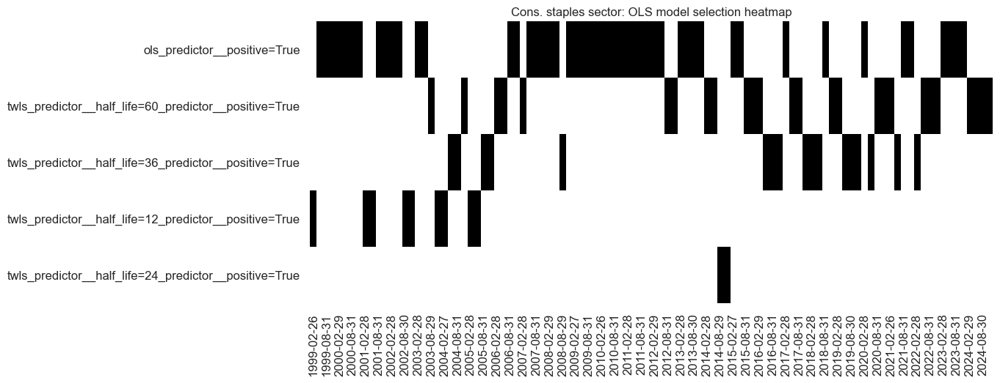

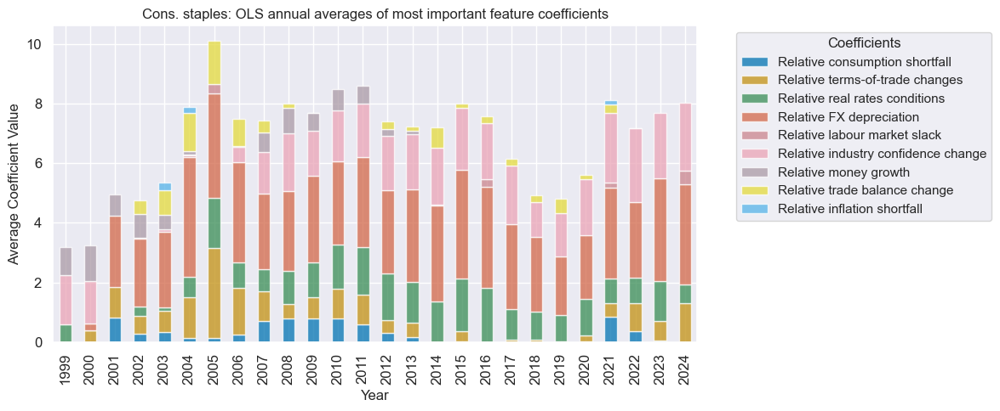

In [92]:
dix = cos_dict

sec = dix["sec"]
trained_models = list(dix["models"])
sigx = dix["signals"][-1]

trained_models[0].models_heatmap(
    sigx,
    cap=10,
    figsize=(12, 5),
    title=f"{sector_labels[sec.upper()]} sector: OLS model selection heatmap",
)

trained_models[0].coefs_stackedbarplot(
    name=sigx,
    figsize=(12, 5),
    ftrs_renamed=rnf_labels,
    title=f"{sector_labels[sec.upper()]}: OLS annual averages of most important feature coefficients",
)

#### Signal quality check

In [93]:
dix = cos_dict

cidx = dix["cidx"]
sec = dix["name"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

catregs = {
    x: msp.CategoryRelations(
        df=dfx,
        xcats=[x, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        blacklist=blax,
        xcat_aggs=["last", "sum"],
        slip=1,
    )
    for x in sigs
}

dix["catregs"] = catregs

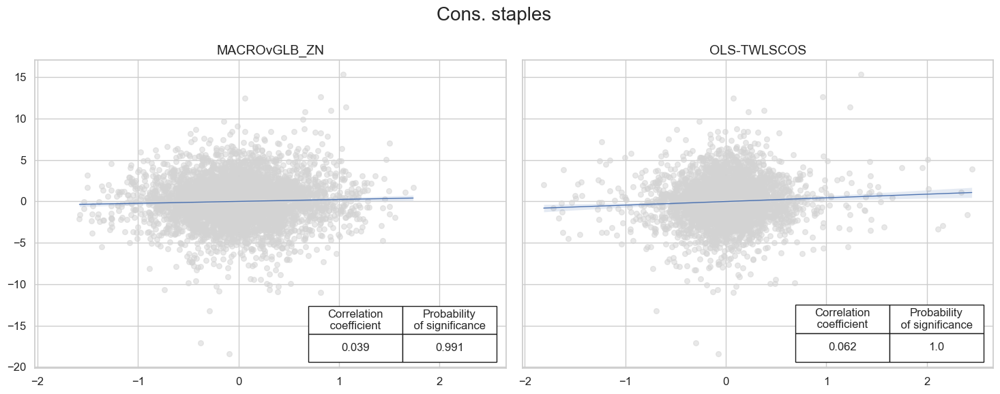

In [94]:
dix = cos_dict
catregs = dix["catregs"]
sigs = dix["signals"]
name = dix["name"]

msv.multiple_reg_scatter(
    cat_rels=list(catregs.values()),
    ncol=2,
    nrow=1,
    figsize=(15, 6),
    title=name,
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab=None,
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=list(sigs),
)

#### Naive PnL

In [95]:
dix = cos_dict

cidx = dix["cidx"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

pnl = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=default_start_date,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN",
    )

dix["pnls"] = pnl

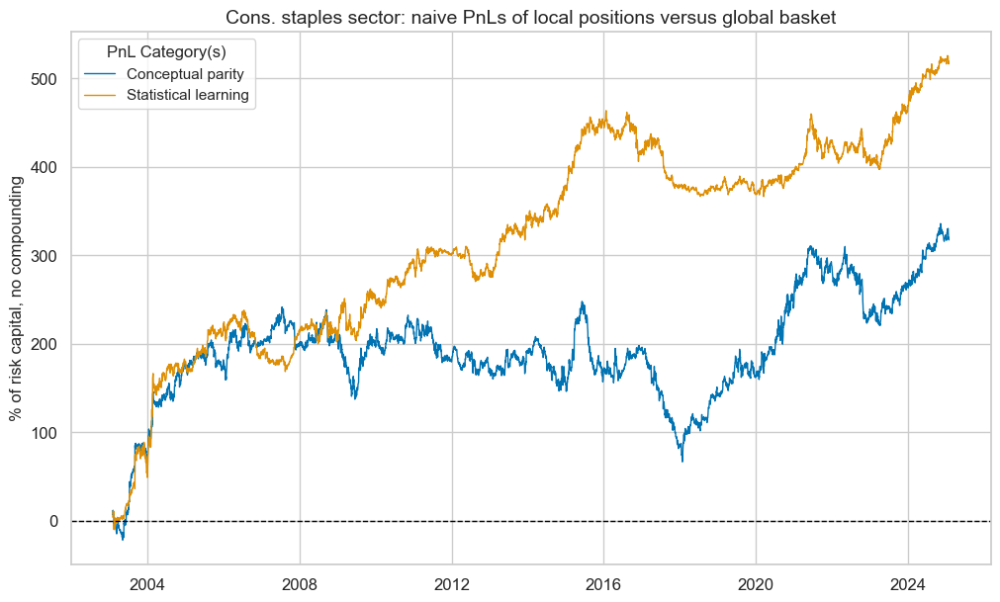

xcat,PNL_MACROvGLB_ZNCOS_PZN,PNL_OLS-TWLSCOS_PZN
Return %,14.419813,23.547044
St. Dev. %,44.880492,37.146436
Sharpe Ratio,0.321294,0.633898
Sortino Ratio,0.46605,0.94715
Max 21-Day Draw %,-47.272419,-37.347505
Max 6-Month Draw %,-85.443358,-53.539861
Peak to Trough Draw %,-181.306868,-97.190894
Top 5% Monthly PnL Share,1.360621,0.664597
USD_EQXR_NSA correl,-0.021485,0.010466
Traded Months,265,265


In [96]:
dix = cos_dict

pnl = dix["pnls"]
name = dix["name"]
sigs = dix["signals"]
pns = [f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN" for sig in sigs]

pnl.plot_pnls(
    pnl_cats=pnl.pnl_names,
    title=f"{name} sector: naive PnLs of local positions versus global basket",
    xcat_labels=["Conceptual parity", "Statistical learning"],
    title_fontsize=14
)

display(pnl.evaluate_pnls(pnl_cats=pnl.pnl_names))


### Healthcare sector

#### Specify analysis

In [97]:
sector = "HLC"

hlc_dict = {
    "sec": sector,
    "name": sector_labels[sector],
    "factors": rn_factors,
    "cidx": cids_eqx,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "models": None,
    "signals": None,
    "catregs": None,
    "pnls": None,
}

#### General learning models and signals

In [98]:
dix = hlc_dict

sec = dix["sec"]
factors = dix["factors"]
ret = dix["ret"]
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]

trained_models = {}
for pair in model_and_grids:
    
    model, grid = pair
    
    opt_pipeline_name = '-'.join(list(model.keys()))
    signal_name = opt_pipeline_name.upper() + sec.upper()
    
    print(
        f"Running the signal learning for {opt_pipeline_name} over {sec} returns."
    )
    
    trained_models[signal_name] = run_single_signal_optimizer(
        df=dfx,
        xcats=factors + [ret],
        cids=cidx,
        blacklist=blax,
        signal_freq=freq,
        signal_name=signal_name,
        models=model,
        hyperparameters=grid,
        learning_config=default_learn_config,
    )
    
    dfa = trained_models[signal_name].get_optimized_signals()
    dfx = msm.update_df(dfx, dfa)

dix["models"] = trained_models.values()
dix["signals"] = ["MACROvGLB_ZN"] + list(trained_models.keys())

Running the signal learning for ols-twls over HLC returns.


  0%|          | 0/104 [00:00<?, ?it/s]

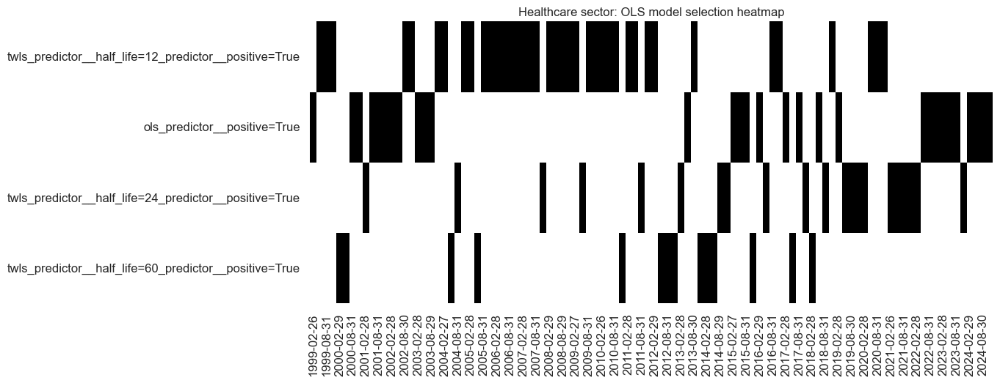

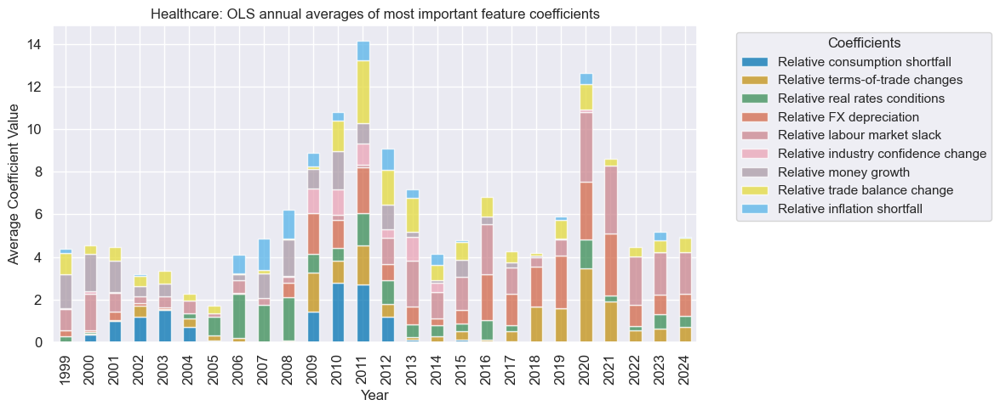

In [99]:
dix = hlc_dict

sec = dix["sec"]
trained_models = list(dix["models"])
sigx = dix["signals"][-1]

trained_models[0].models_heatmap(
    sigx,
    cap=10,
    figsize=(12, 5),
    title=f"{sector_labels[sec.upper()]} sector: OLS model selection heatmap",
)

trained_models[0].coefs_stackedbarplot(
    name=sigx,
    figsize=(12, 5),
    ftrs_renamed=rnf_labels,
    title=f"{sector_labels[sec.upper()]}: OLS annual averages of most important feature coefficients",
)

#### Signal quality check

In [100]:
dix = hlc_dict

cidx = dix["cidx"]
sec = dix["name"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

catregs = {
    x: msp.CategoryRelations(
        df=dfx,
        xcats=[x, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        blacklist=blax,
        xcat_aggs=["last", "sum"],
        slip=1,
    )
    for x in sigs
}

dix["catregs"] = catregs

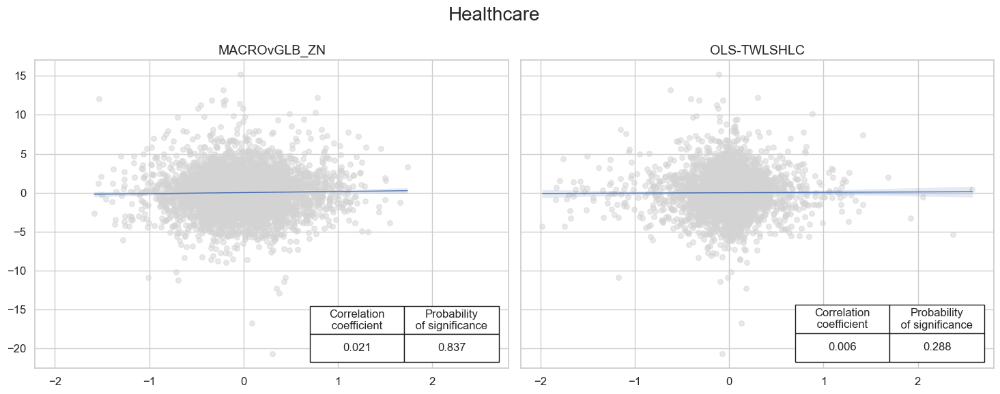

In [101]:
dix = hlc_dict
catregs = dix["catregs"]
sigs = dix["signals"]
name = dix["name"]

msv.multiple_reg_scatter(
    cat_rels=list(catregs.values()),
    ncol=2,
    nrow=1,
    figsize=(15, 6),
    title=name,
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab=None,
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=list(sigs),
)

#### Naive PnL

In [102]:
dix = hlc_dict

cidx = dix["cidx"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

pnl = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=default_start_date,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN",
    )

dix["pnls"] = pnl

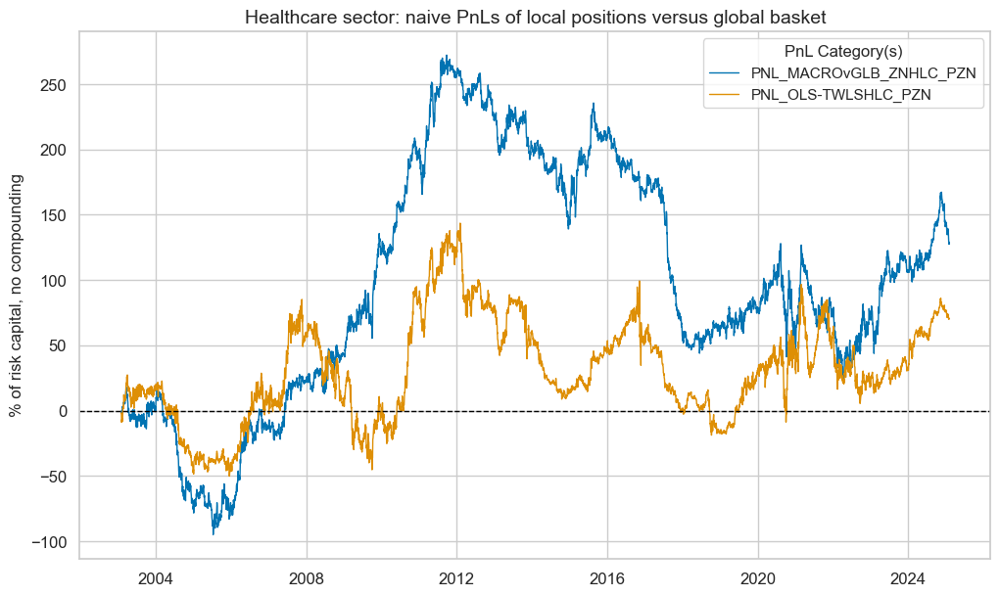

xcat,PNL_MACROvGLB_ZNHLC_PZN,PNL_OLS-TWLSHLC_PZN
Return %,5.802367,3.188083
St. Dev. %,45.378437,47.717625
Sharpe Ratio,0.127866,0.066811
Sortino Ratio,0.182353,0.093449
Max 21-Day Draw %,-53.906462,-58.072938
Max 6-Month Draw %,-101.337763,-62.747428
Peak to Trough Draw %,-249.55333,-162.298461
Top 5% Monthly PnL Share,3.396111,5.324908
USD_EQXR_NSA correl,0.005739,0.000198
Traded Months,265,265


In [103]:
dix = hlc_dict

pnl = dix["pnls"]
name = dix["name"]
sigs = dix["signals"]
pns = [f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN" for sig in sigs]

pnl.plot_pnls(
    pnl_cats=pnl.pnl_names,
    title=f"{name} sector: naive PnLs of local positions versus global basket",
    title_fontsize=14
)

display(pnl.evaluate_pnls(pnl_cats=pnl.pnl_names))

### Financials sector

#### Specify analysis

In [104]:
sector = "FIN"

fin_dict = {
    "sec": sector,
    "name": sector_labels[sector],
    "factors": rn_factors,
    "cidx": cids_eqx,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "models": None,
    "signals": None,
    "catregs": None,
    "pnls": None,
}

#### General learning models and signals

In [105]:
dix = fin_dict

sec = dix["sec"]
factors = dix["factors"]
ret = dix["ret"]
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]

trained_models = {}
for pair in model_and_grids:
    
    model, grid = pair
    
    opt_pipeline_name = '-'.join(list(model.keys()))
    signal_name = opt_pipeline_name.upper() + sec.upper()
    
    print(
        f"Running the signal learning for {opt_pipeline_name} over {sec} returns."
    )
    
    trained_models[signal_name] = run_single_signal_optimizer(
        df=dfx,
        xcats=factors + [ret],
        cids=cidx,
        blacklist=blax,
        signal_freq=freq,
        signal_name=signal_name,
        models=model,
        hyperparameters=grid,
        learning_config=default_learn_config,
    )
    
    dfa = trained_models[signal_name].get_optimized_signals()
    dfx = msm.update_df(dfx, dfa)

dix["models"] = trained_models.values()
dix["signals"] = ["MACROvGLB_ZN"] + list(trained_models.keys())

Running the signal learning for ols-twls over FIN returns.


  0%|          | 0/104 [00:00<?, ?it/s]

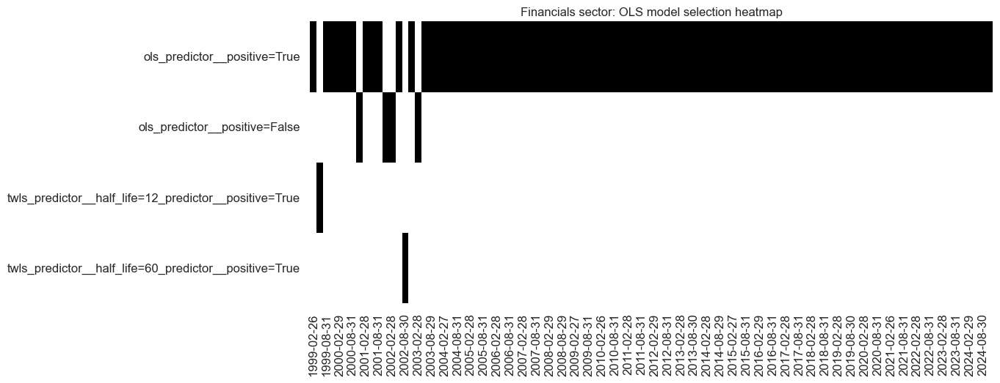

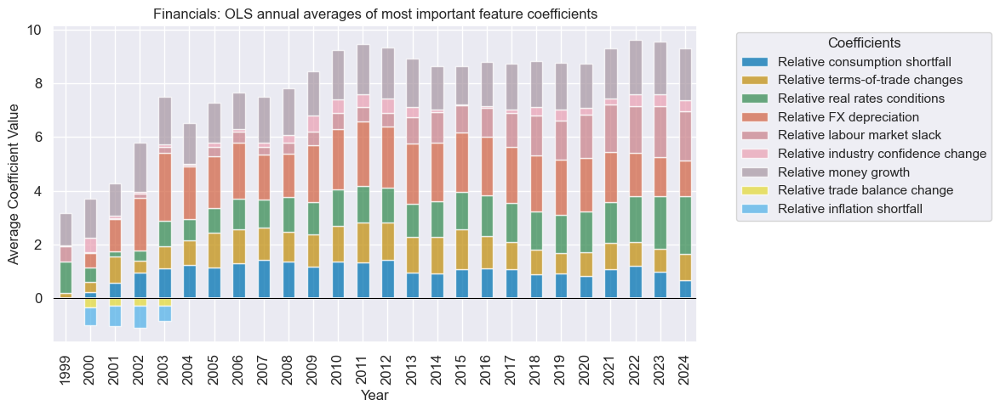

In [106]:
dix = fin_dict

sec = dix["sec"]
trained_models = list(dix["models"])
sigx = dix["signals"][-1]

trained_models[0].models_heatmap(
    sigx,
    cap=10,
    figsize=(12, 5),
    title=f"{sector_labels[sec.upper()]} sector: OLS model selection heatmap",
)

trained_models[0].coefs_stackedbarplot(
    name=sigx,
    figsize=(12, 5),
    ftrs_renamed=rnf_labels,
    title=f"{sector_labels[sec.upper()]}: OLS annual averages of most important feature coefficients",
)

#### Signal quality check

In [107]:
dix = fin_dict

cidx = dix["cidx"]
sec = dix["name"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

catregs = {
    x: msp.CategoryRelations(
        df=dfx,
        xcats=[x, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        blacklist=blax,
        xcat_aggs=["last", "sum"],
        slip=1,
    )
    for x in sigs
}

dix["catregs"] = catregs

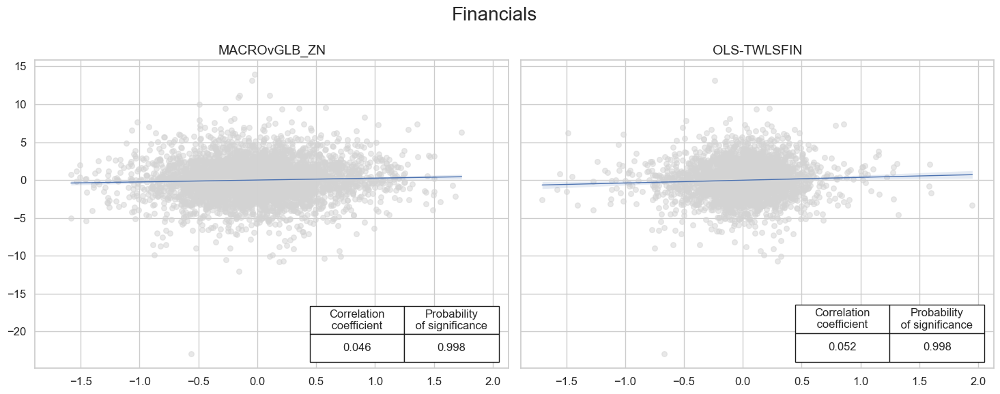

In [108]:
dix = fin_dict
catregs = dix["catregs"]
sigs = dix["signals"]
name = dix["name"]

msv.multiple_reg_scatter(
    cat_rels=list(catregs.values()),
    ncol=2,
    nrow=1,
    figsize=(15, 6),
    title=name,
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab=None,
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=list(sigs),
)


#### Naive PnL

In [109]:
dix = fin_dict

cidx = dix["cidx"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

pnl = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=default_start_date,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN",
    )

dix["pnls"] = pnl

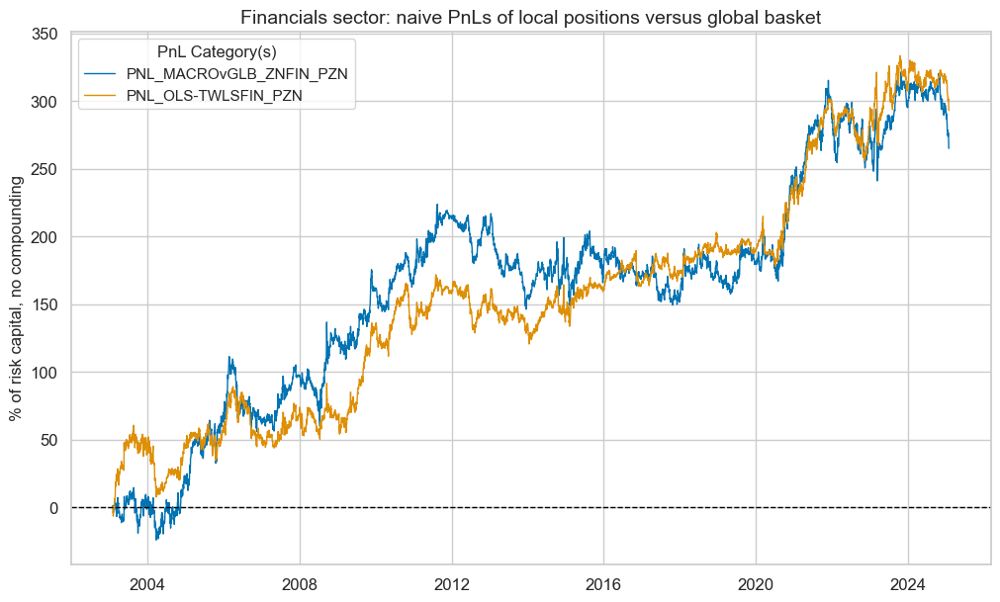

xcat,PNL_MACROvGLB_ZNFIN_PZN,PNL_OLS-TWLSFIN_PZN
Return %,12.056577,13.333702
St. Dev. %,40.854767,33.135203
Sharpe Ratio,0.295108,0.402403
Sortino Ratio,0.420895,0.574648
Max 21-Day Draw %,-37.930345,-42.82288
Max 6-Month Draw %,-49.185743,-39.81963
Peak to Trough Draw %,-77.549377,-54.280439
Top 5% Monthly PnL Share,1.134339,0.85713
USD_EQXR_NSA correl,-0.037596,-0.008272
Traded Months,265,265


In [110]:
dix = fin_dict

pnl = dix["pnls"]
name = dix["name"]
sigs = dix["signals"]
pns = [f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN" for sig in sigs]

pnl.plot_pnls(
    pnl_cats=pnl.pnl_names,
    title=f"{name} sector: naive PnLs of local positions versus global basket",
    title_fontsize=14
)

display(pnl.evaluate_pnls(pnl_cats=pnl.pnl_names))

### Technology sector

#### Specify analysis

In [111]:
sector = "ITE"

ite_dict = {
    "sec": sector,
    "name": sector_labels[sector],
    "factors": rn_factors,
    "cidx": cids_eqx,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "models": None,
    "signals": None,
    "catregs": None,
    "pnls": None,
}

#### General learning models and signals

In [112]:
dix = ite_dict

sec = dix["sec"]
factors = dix["factors"]
ret = dix["ret"]
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]

trained_models = {}
for pair in model_and_grids:
    
    model, grid = pair
    
    opt_pipeline_name = '-'.join(list(model.keys()))
    signal_name = opt_pipeline_name.upper() + sec.upper()
    
    print(
        f"Running the signal learning for {opt_pipeline_name} over {sec} returns."
    )
    
    trained_models[signal_name] = run_single_signal_optimizer(
        df=dfx,
        xcats=factors + [ret],
        cids=cidx,
        blacklist=blax,
        signal_freq=freq,
        signal_name=signal_name,
        models=model,
        hyperparameters=grid,
        learning_config=default_learn_config,
    )
    
    dfa = trained_models[signal_name].get_optimized_signals()
    dfx = msm.update_df(dfx, dfa)

dix["models"] = trained_models.values()
dix["signals"] = ["MACROvGLB_ZN"] + list(trained_models.keys())

Running the signal learning for ols-twls over ITE returns.


  0%|          | 0/104 [00:00<?, ?it/s]

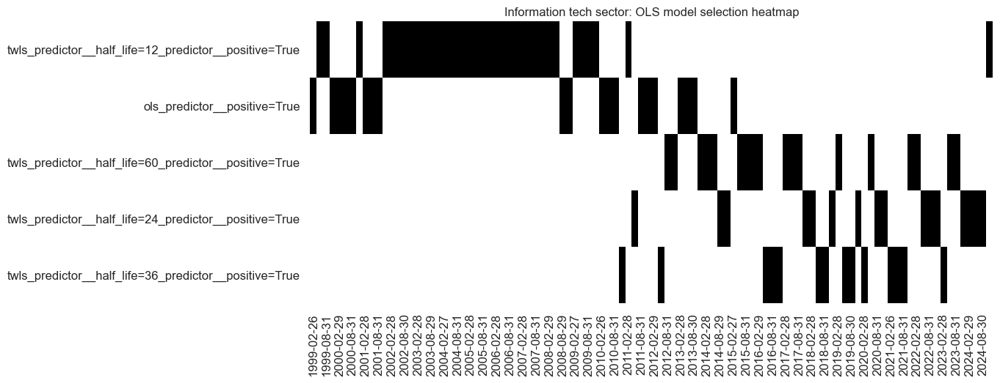

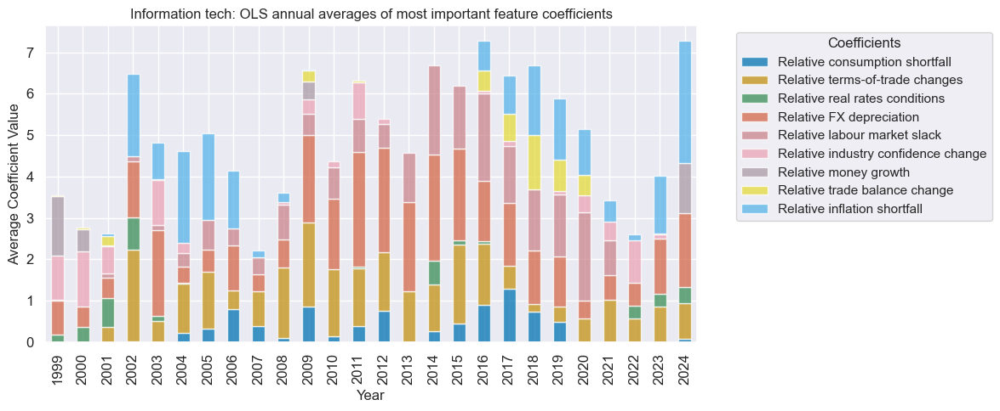

In [113]:
dix = ite_dict

sec = dix["sec"]
trained_models = list(dix["models"])
sigx = dix["signals"][-1]

trained_models[0].models_heatmap(
    sigx,
    cap=10,
    figsize=(12, 5),
    title=f"{sector_labels[sec.upper()]} sector: OLS model selection heatmap",
)

trained_models[0].coefs_stackedbarplot(
    name=sigx,
    figsize=(12, 5),
    ftrs_renamed=rnf_labels,
    title=f"{sector_labels[sec.upper()]}: OLS annual averages of most important feature coefficients",
)

#### Signal quality check

In [114]:
dix = ite_dict

cidx = dix["cidx"]
sec = dix["name"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

catregs = {
    x: msp.CategoryRelations(
        df=dfx,
        xcats=[x, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        blacklist=blax,
        xcat_aggs=["last", "sum"],
        slip=1,
    )
    for x in sigs
}

dix["catregs"] = catregs

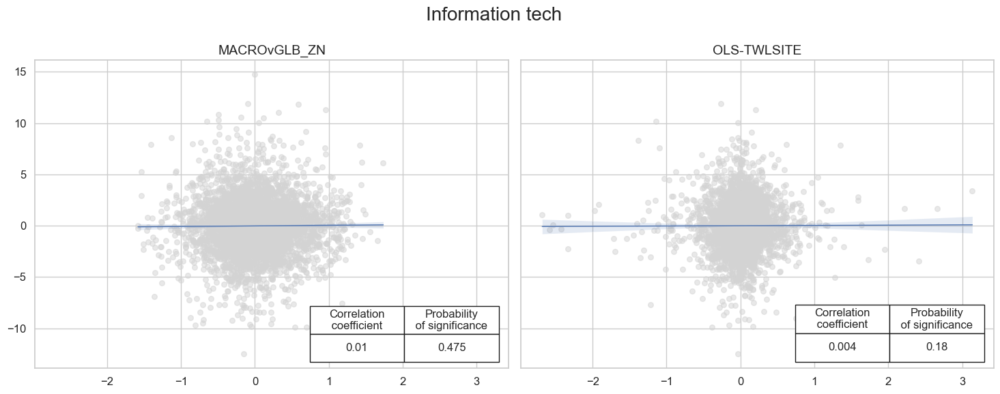

In [115]:
dix = ite_dict
catregs = dix["catregs"]
sigs = dix["signals"]
name = dix["name"]

msv.multiple_reg_scatter(
    cat_rels=list(catregs.values()),
    ncol=2,
    nrow=1,
    figsize=(15, 6),
    title=name,
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab=None,
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=list(sigs),
)

#### Naive PnL

In [116]:
dix = ite_dict

cidx = dix["cidx"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

pnl = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=default_start_date,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN",
    )

dix["pnls"] = pnl

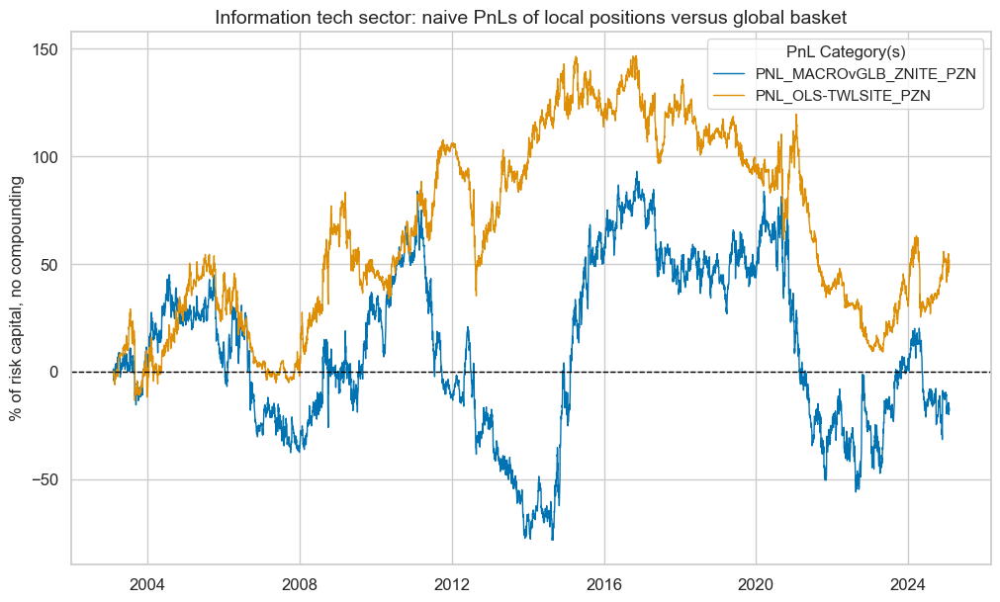

xcat,PNL_MACROvGLB_ZNITE_PZN,PNL_OLS-TWLSITE_PZN
Return %,-0.77153,2.357259
St. Dev. %,42.145181,33.176367
Sharpe Ratio,-0.018306,0.071052
Sortino Ratio,-0.025938,0.099154
Max 21-Day Draw %,-43.416136,-43.576797
Max 6-Month Draw %,-81.927212,-63.897049
Peak to Trough Draw %,-162.003626,-137.669068
Top 5% Monthly PnL Share,-20.810073,4.957344
USD_EQXR_NSA correl,-0.019101,0.016885
Traded Months,265,265


In [117]:
dix = ite_dict

pnl = dix["pnls"]
name = dix["name"]
sigs = dix["signals"]
pns = [f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN" for sig in sigs]

pnl.plot_pnls(
    pnl_cats=pnl.pnl_names,
    title=f"{name} sector: naive PnLs of local positions versus global basket",
    title_fontsize=14
)

display(pnl.evaluate_pnls(pnl_cats=pnl.pnl_names))

### Communication services sector

#### Specify analysis

In [118]:
sector = "CSR"

csr_dict = {
    "sec": sector,
    "name": sector_labels[sector],
    "factors": rn_factors,
    "cidx": cids_eqx,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "models": None,
    "signals": None,
    "catregs": None,
    "pnls": None,
}

#### General learning models and signals

In [119]:
dix = csr_dict

sec = dix["sec"]
factors = dix["factors"]
ret = dix["ret"]
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]

trained_models = {}
for pair in model_and_grids:
    
    model, grid = pair
    
    opt_pipeline_name = '-'.join(list(model.keys()))
    signal_name = opt_pipeline_name.upper() + sec.upper()
    
    print(
        f"Running the signal learning for {opt_pipeline_name} over {sec} returns."
    )
    
    trained_models[signal_name] = run_single_signal_optimizer(
        df=dfx,
        xcats=factors + [ret],
        cids=cidx,
        blacklist=blax,
        signal_freq=freq,
        signal_name=signal_name,
        models=model,
        hyperparameters=grid,
        learning_config=default_learn_config,
    )
    
    dfa = trained_models[signal_name].get_optimized_signals()
    dfx = msm.update_df(dfx, dfa)

dix["models"] = trained_models.values()
dix["signals"] = ["MACROvGLB_ZN"] + list(trained_models.keys())

Running the signal learning for ols-twls over CSR returns.


  0%|          | 0/104 [00:00<?, ?it/s]

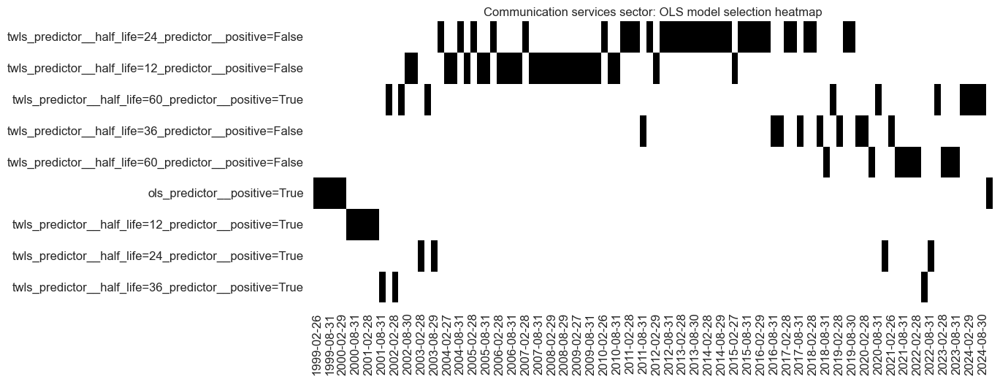

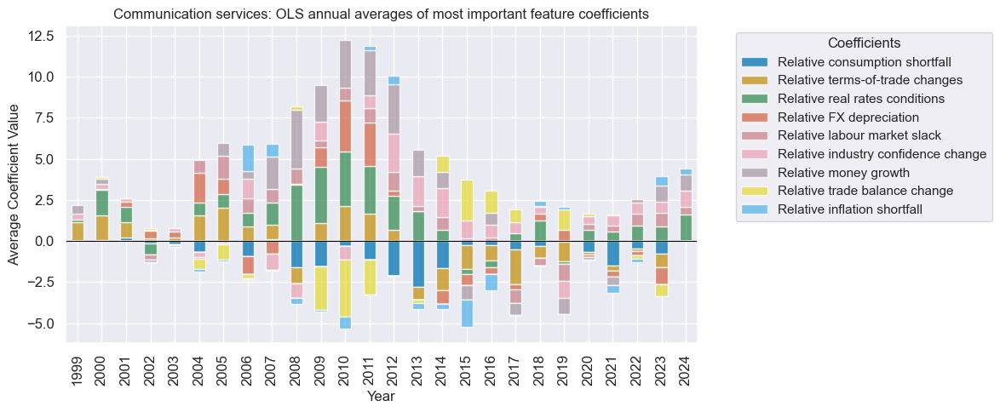

In [120]:
dix = csr_dict

sec = dix["sec"]
trained_models = list(dix["models"])
sigx = dix["signals"][-1]

trained_models[0].models_heatmap(
    sigx,
    cap=10,
    figsize=(12, 5),
    title=f"{sector_labels[sec.upper()]} sector: OLS model selection heatmap",
)

trained_models[0].coefs_stackedbarplot(
    name=sigx,
    figsize=(12, 5),
    ftrs_renamed=rnf_labels,
    title=f"{sector_labels[sec.upper()]}: OLS annual averages of most important feature coefficients",
)

#### Signal quality check

In [121]:
dix = csr_dict

cidx = dix["cidx"]
sec = dix["name"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

catregs = {
    x: msp.CategoryRelations(
        df=dfx,
        xcats=[x, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        blacklist=blax,
        xcat_aggs=["last", "sum"],
        slip=1,
    )
    for x in sigs
}

dix["catregs"] = catregs

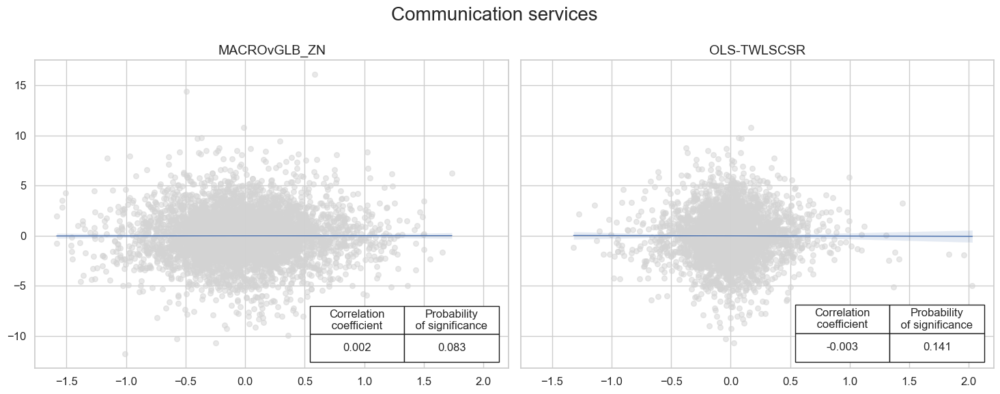

In [122]:
dix = csr_dict
catregs = dix["catregs"]
sigs = dix["signals"]
name = dix["name"]

msv.multiple_reg_scatter(
    cat_rels=list(catregs.values()),
    ncol=2,
    nrow=1,
    figsize=(15, 6),
    title=name,
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab=None,
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=list(sigs),
)

#### Naive PnL

In [123]:
dix = csr_dict

cidx = dix["cidx"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

pnl = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=default_start_date,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN",
    )

dix["pnls"] = pnl

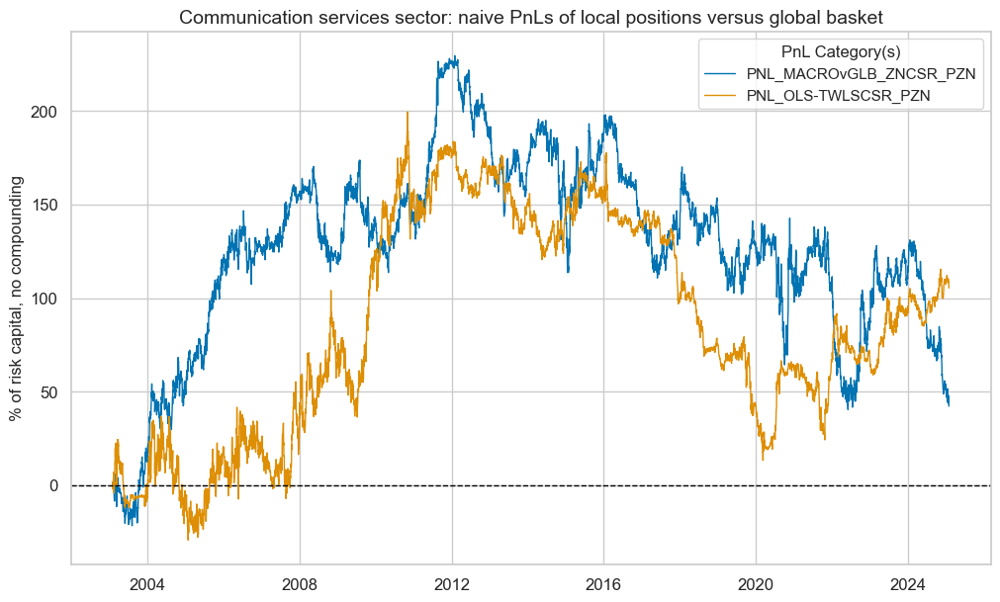

xcat,PNL_MACROvGLB_ZNCSR_PZN,PNL_OLS-TWLSCSR_PZN
Return %,1.916876,4.791566
St. Dev. %,44.08786,43.618606
Sharpe Ratio,0.043479,0.109851
Sortino Ratio,0.061637,0.156437
Max 21-Day Draw %,-47.783291,-54.459976
Max 6-Month Draw %,-89.214881,-59.61521
Peak to Trough Draw %,-189.275426,-186.293875
Top 5% Monthly PnL Share,8.096827,3.122077
USD_EQXR_NSA correl,-0.01243,0.078215
Traded Months,265,265


In [124]:
dix = csr_dict

pnl = dix["pnls"]
name = dix["name"]
sigs = dix["signals"]
pns = [f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN" for sig in sigs]

pnl.plot_pnls(
    pnl_cats=pnl.pnl_names,
    title=f"{name} sector: naive PnLs of local positions versus global basket",
    title_fontsize=14
)

display(pnl.evaluate_pnls(pnl_cats=pnl.pnl_names))

### Utilities sector

#### Specify analysis

In [125]:
sector = "UTL"

utl_dict = {
    "sec": sector,
    "name": sector_labels[sector],
    "factors": rn_factors,
    "cidx": cids_eqx,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "models": None,
    "signals": None,
    "catregs": None,
    "pnls": None,
}

#### General learning models and signals

In [126]:
dix = utl_dict

sec = dix["sec"]
factors = dix["factors"]
ret = dix["ret"]
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]

trained_models = {}
for pair in model_and_grids:
    
    model, grid = pair
    
    opt_pipeline_name = '-'.join(list(model.keys()))
    signal_name = opt_pipeline_name.upper() + sec.upper()
    
    print(
        f"Running the signal learning for {opt_pipeline_name} over {sec} returns."
    )
    
    trained_models[signal_name] = run_single_signal_optimizer(
        df=dfx,
        xcats=factors + [ret],
        cids=cidx,
        blacklist=blax,
        signal_freq=freq,
        signal_name=signal_name,
        models=model,
        hyperparameters=grid,
        learning_config=default_learn_config,
    )
    
    dfa = trained_models[signal_name].get_optimized_signals()
    dfx = msm.update_df(dfx, dfa)

dix["models"] = trained_models.values()
dix["signals"] = ["MACROvGLB_ZN"] + list(trained_models.keys())

Running the signal learning for ols-twls over UTL returns.


  0%|          | 0/104 [00:00<?, ?it/s]

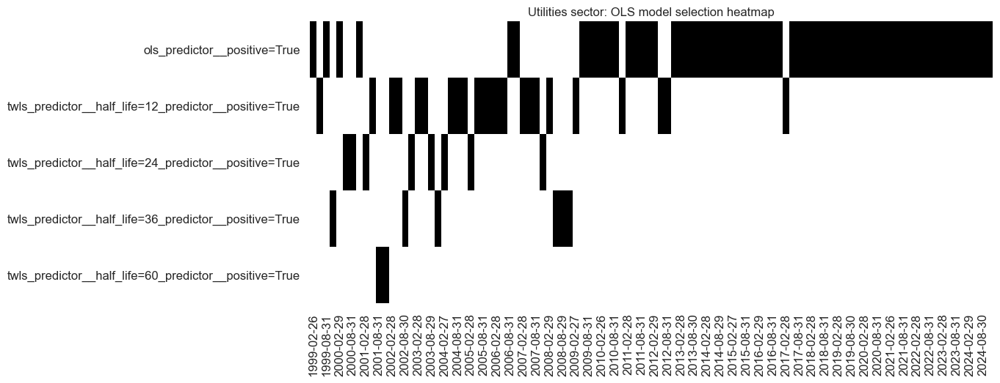

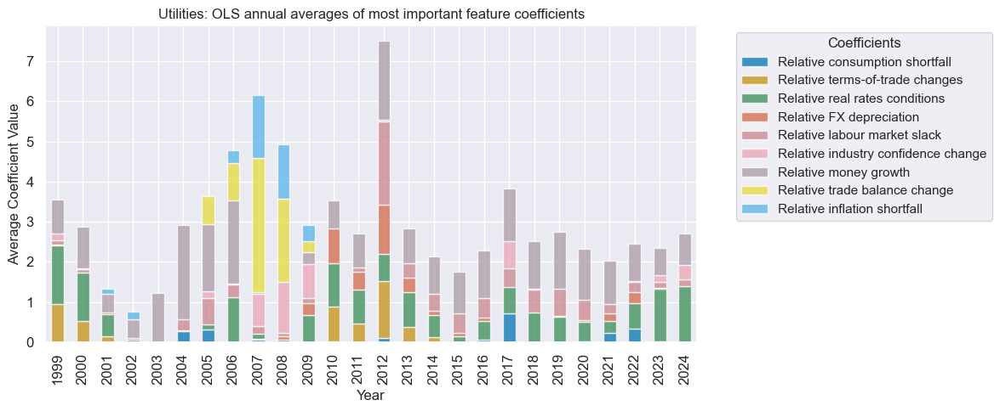

In [127]:
dix = utl_dict

sec = dix["sec"]
trained_models = list(dix["models"])
sigx = dix["signals"][-1]

trained_models[0].models_heatmap(
    sigx,
    cap=10,
    figsize=(12, 5),
    title=f"{sector_labels[sec.upper()]} sector: OLS model selection heatmap",
)

trained_models[0].coefs_stackedbarplot(
    name=sigx,
    figsize=(12, 5),
    ftrs_renamed=rnf_labels,
    title=f"{sector_labels[sec.upper()]}: OLS annual averages of most important feature coefficients",
)

#### Signal quality check

In [128]:
dix = utl_dict

cidx = dix["cidx"]
sec = dix["name"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

catregs = {
    x: msp.CategoryRelations(
        df=dfx,
        xcats=[x, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        blacklist=blax,
        xcat_aggs=["last", "sum"],
        slip=1,
    )
    for x in sigs
}

dix["catregs"] = catregs

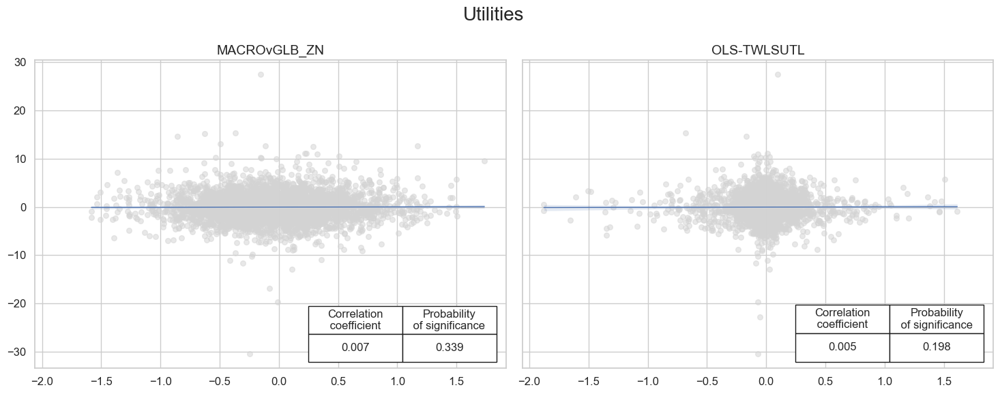

In [129]:
dix = utl_dict
catregs = dix["catregs"]
sigs = dix["signals"]
name = dix["name"]

msv.multiple_reg_scatter(
    cat_rels=list(catregs.values()),
    ncol=2,
    nrow=1,
    figsize=(15, 6),
    title=name,
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab=None,
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=list(sigs),
)

#### Naive PnL

In [130]:
dix = utl_dict

cidx = dix["cidx"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

pnl = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=default_start_date,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN",
    )

dix["pnls"] = pnl

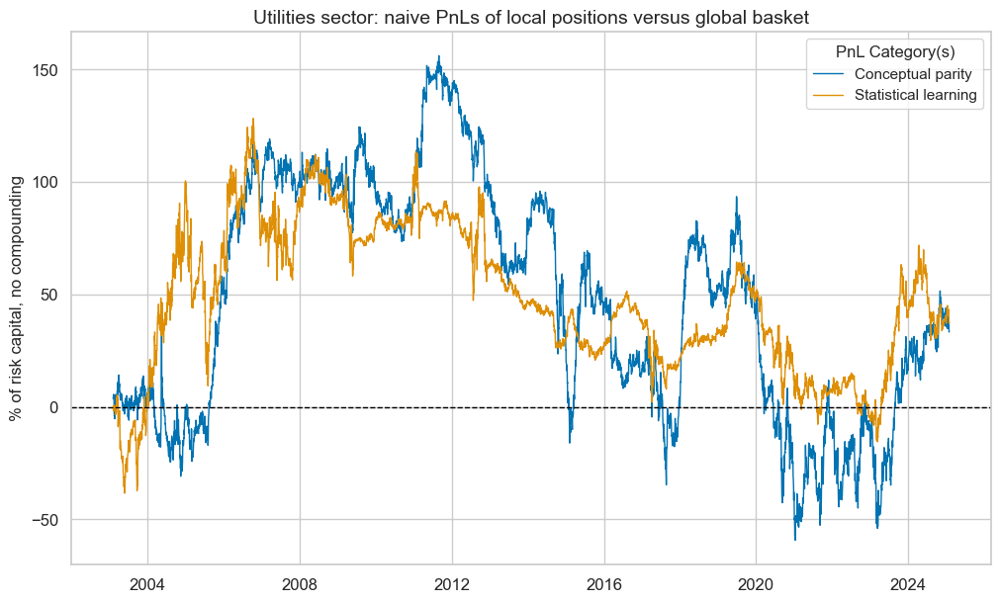

xcat,PNL_MACROvGLB_ZNUTL_PZN,PNL_OLS-TWLSUTL_PZN
Return %,1.523717,1.690559
St. Dev. %,43.871937,34.831333
Sharpe Ratio,0.034731,0.048536
Sortino Ratio,0.04986,0.069427
Max 21-Day Draw %,-51.957826,-46.474793
Max 6-Month Draw %,-99.535074,-66.647997
Peak to Trough Draw %,-215.279867,-143.747461
Top 5% Monthly PnL Share,9.930358,6.726264
USD_EQXR_NSA correl,0.010379,0.023909
Traded Months,265,265


In [131]:
dix = utl_dict

pnl = dix["pnls"]
name = dix["name"]
sigs = dix["signals"]
pns = [f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN" for sig in sigs]

pnl.plot_pnls(
    pnl_cats=pnl.pnl_names,
    title=f"{name} sector: naive PnLs of local positions versus global basket",
    xcat_labels=["Conceptual parity", "Statistical learning"],
    title_fontsize=14
)

display(pnl.evaluate_pnls(pnl_cats=pnl.pnl_names))



### Real estate sector

#### Specify analysis

In [132]:
sector = "REL"

rel_dict = {
    "sec": sector,
    "name": sector_labels[sector],
    "factors": rn_factors,
    "cidx": cids_eqx,
    "ret": f"EQC{sector}{default_target_type}",
    "freq": "M",
    "black": sector_blacklist[sector],
    "models": None,
    "signals": None,
    "catregs": None,
    "pnls": None,
}

#### General learning models and signals

In [133]:
dix = rel_dict

sec = dix["sec"]
factors = dix["factors"]
ret = dix["ret"]
cidx = dix["cidx"]
freq = dix["freq"]
blax = dix["black"]

trained_models = {}
for pair in model_and_grids:
    
    model, grid = pair
    
    opt_pipeline_name = '-'.join(list(model.keys()))
    signal_name = opt_pipeline_name.upper() + sec.upper()
    
    print(
        f"Running the signal learning for {opt_pipeline_name} over {sec} returns."
    )
    
    trained_models[signal_name] = run_single_signal_optimizer(
        df=dfx,
        xcats=factors + [ret],
        cids=cidx,
        blacklist=blax,
        signal_freq=freq,
        signal_name=signal_name,
        models=model,
        hyperparameters=grid,
        learning_config=default_learn_config,
    )
    
    dfa = trained_models[signal_name].get_optimized_signals()
    dfx = msm.update_df(dfx, dfa)

dix["models"] = trained_models.values()
dix["signals"] = ["MACROvGLB_ZN"] + list(trained_models.keys())

Running the signal learning for ols-twls over REL returns.


  0%|          | 0/104 [00:00<?, ?it/s]

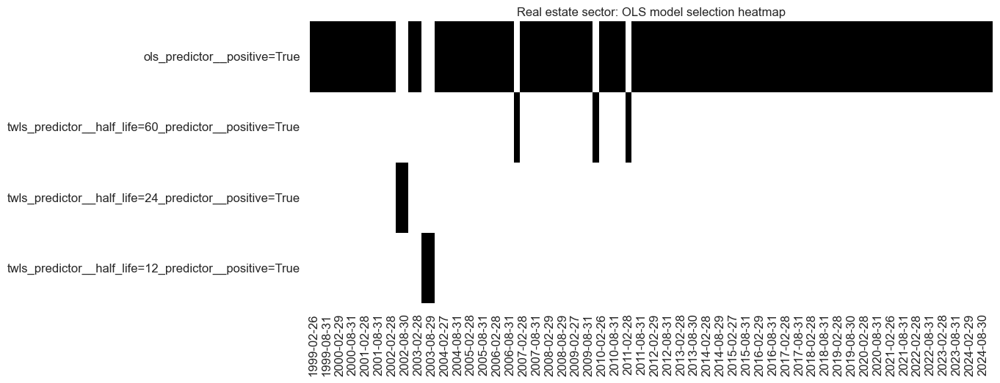

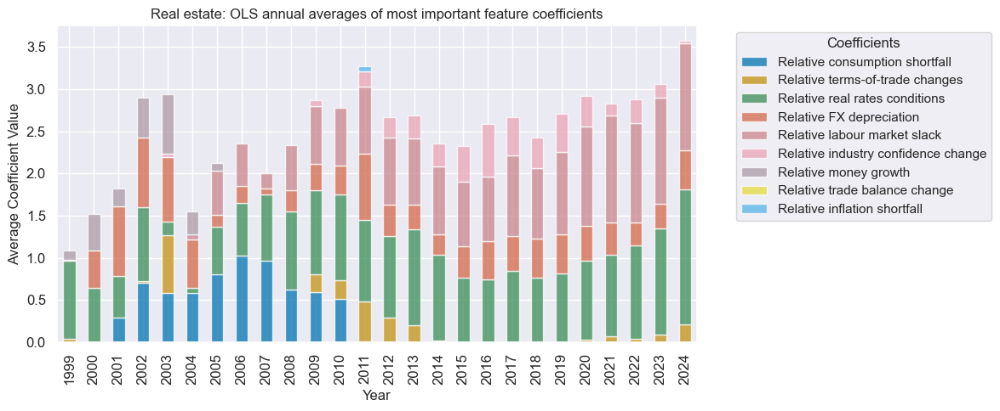

In [134]:
dix = rel_dict

sec = dix["sec"]
trained_models = list(dix["models"])
sigx = dix["signals"][-1]

trained_models[0].models_heatmap(
    sigx,
    cap=10,
    figsize=(12, 5),
    title=f"{sector_labels[sec.upper()]} sector: OLS model selection heatmap",
)

trained_models[0].coefs_stackedbarplot(
    name=sigx,
    figsize=(12, 5),
    ftrs_renamed=rnf_labels,
    title=f"{sector_labels[sec.upper()]}: OLS annual averages of most important feature coefficients",
)

#### Signal quality check

In [135]:
dix = rel_dict

cidx = dix["cidx"]
sec = dix["name"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

catregs = {
    x: msp.CategoryRelations(
        df=dfx,
        xcats=[x, ret],
        cids=cidx,
        freq=freq,
        lag=1,
        blacklist=blax,
        xcat_aggs=["last", "sum"],
        slip=1,
    )
    for x in sigs
}

dix["catregs"] = catregs

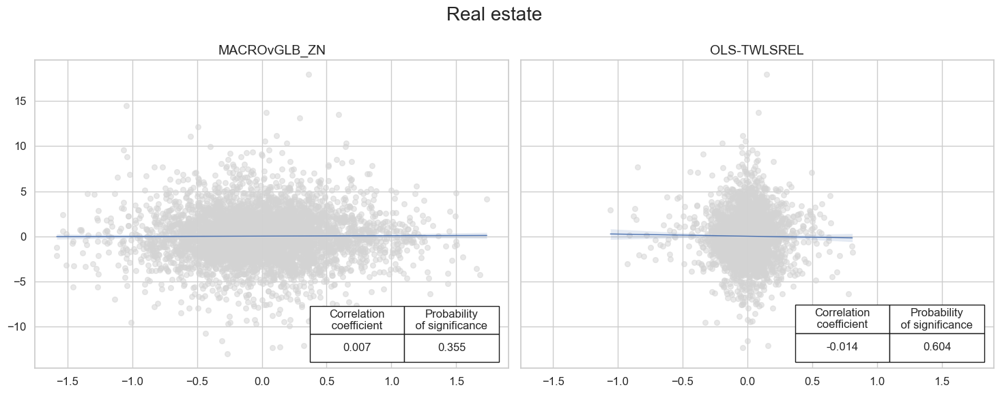

In [136]:
dix = rel_dict
catregs = dix["catregs"]
sigs = dix["signals"]
name = dix["name"]

msv.multiple_reg_scatter(
    cat_rels=list(catregs.values()),
    ncol=2,
    nrow=1,
    figsize=(15, 6),
    title=name,
    title_xadj=0.5,
    title_yadj=0.99,
    title_fontsize=20,
    xlab=None,
    ylab=None,
    coef_box="lower right",
    prob_est="map",
    single_chart=True,
    subplot_titles=list(sigs),
)

#### Naive PnL

In [137]:
dix = rel_dict

cidx = dix["cidx"]
sigs = dix["signals"]
ret = dix["ret"]
freq = dix["freq"]
blax = dix["black"]

pnl = msn.NaivePnL(
    df=dfx,
    ret=ret,
    sigs=sigs,
    cids=cidx,
    start=default_start_date,
    blacklist=blax,
    bms=["USD_EQXR_NSA"],
)

for sig in sigs:
    pnl.make_pnl(
        sig=sig,
        sig_op="zn_score_pan",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale = None,
        thresh=3,
        pnl_name=f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN",
    )

dix["pnls"] = pnl

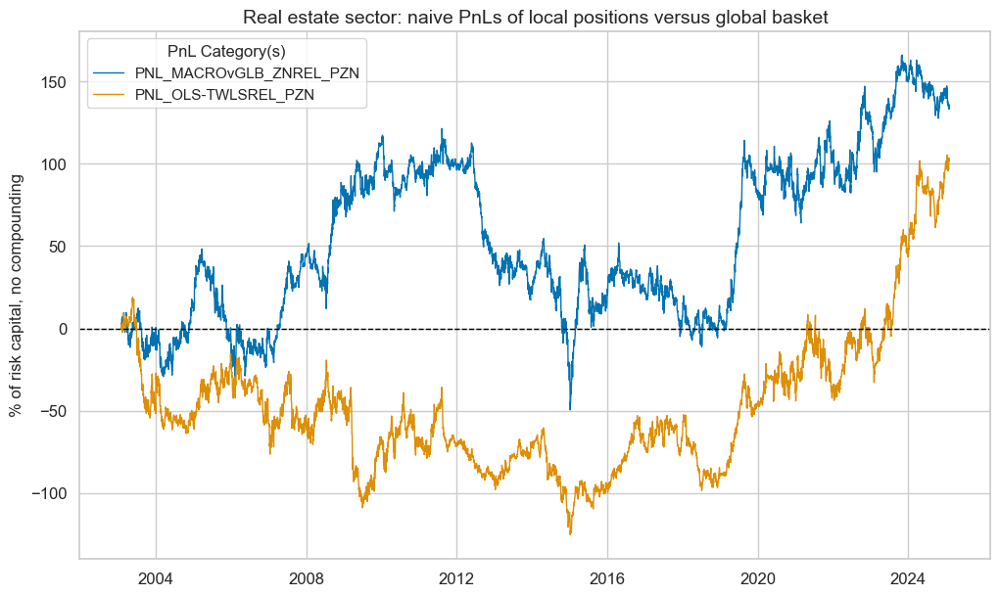

xcat,PNL_MACROvGLB_ZNREL_PZN,PNL_OLS-TWLSREL_PZN
Return %,6.131712,4.618911
St. Dev. %,42.809165,38.409349
Sharpe Ratio,0.143234,0.120255
Sortino Ratio,0.206328,0.172417
Max 21-Day Draw %,-46.448936,-55.626967
Max 6-Month Draw %,-76.838133,-66.236996
Peak to Trough Draw %,-170.951576,-144.179028
Top 5% Monthly PnL Share,2.115738,2.822825
USD_EQXR_NSA correl,-0.005657,0.039127
Traded Months,265,265


In [138]:
dix = rel_dict

pnl = dix["pnls"]
name = dix["name"]
sigs = dix["signals"]
pns = [f"PNL_{sig}_PZN" if sig != "MACROvGLB_ZN" else f"PNL_{sig}{dix['sec']}_PZN" for sig in sigs]

pnl.plot_pnls(
    pnl_cats=pnl.pnl_names,
    title=f"{name} sector: naive PnLs of local positions versus global basket",
    title_fontsize=14
)

display(pnl.evaluate_pnls(pnl_cats=pnl.pnl_names))

## Combination of sector equity factors

In [139]:
sectors_pnls = {
    # "all": all_dict["pnls"],
    "enr": enr_dict["pnls"], 
    "mat": mat_dict["pnls"],
    "ind": ind_dict["pnls"],
    "cod": cod_dict["pnls"],
    "cos": cos_dict["pnls"],
    "hlc": hlc_dict["pnls"],
    "fin": fin_dict["pnls"],
    "ite": ite_dict["pnls"],
    "csr": csr_dict["pnls"],
    "utl": utl_dict["pnls"],
    "rel": rel_dict["pnls"],
}

signal_families = {
    "OLS-TWLS": "statistical learning",
    "MACROvGLB_ZN": "conceptual risk parity",
}

In [140]:
multisignal_multisector_pnls = msn.MultiPnL()
multisignal_multisector_pnls.performance_summary = {}

for signal_type, signal_desc in signal_families.items():

    signal_family_xcats = []

    for sec, sec_pnl in sectors_pnls.items():

        # specifying the name of the PnL to import from the single sector PnL object into the multisector one
        single_pnl_xcats = [f"PNL_{signal_type}{sec.upper()}_PZN"]
        signal_family_xcats.extend(single_pnl_xcats)
        # Adding the PnL from the sector
        multisignal_multisector_pnls.add_pnl(sec_pnl, pnl_xcats=single_pnl_xcats)

    # computing the average across all sectors for this family of signals
    signal_family_combo = f"Average for {signal_desc} signals"
    multisignal_multisector_pnls.combine_pnls(
        pnl_xcats=signal_family_xcats,
        composite_pnl_xcat=signal_family_combo,
        weights=None,
    )
    signal_family_xcats.extend([signal_family_combo])
    
    # Calculating the return statistics
    multisignal_multisector_pnls.performance_summary[signal_type] = multisignal_multisector_pnls.evaluate_pnls(pnl_xcats=signal_family_xcats).rename(
        columns={
            f"PNL_{signal_type}{sec.upper()}_PZN/EQC{sec.upper()}XR_VT10vGLB": sector_labels[sec.upper()] for sec in secs
        }
    )


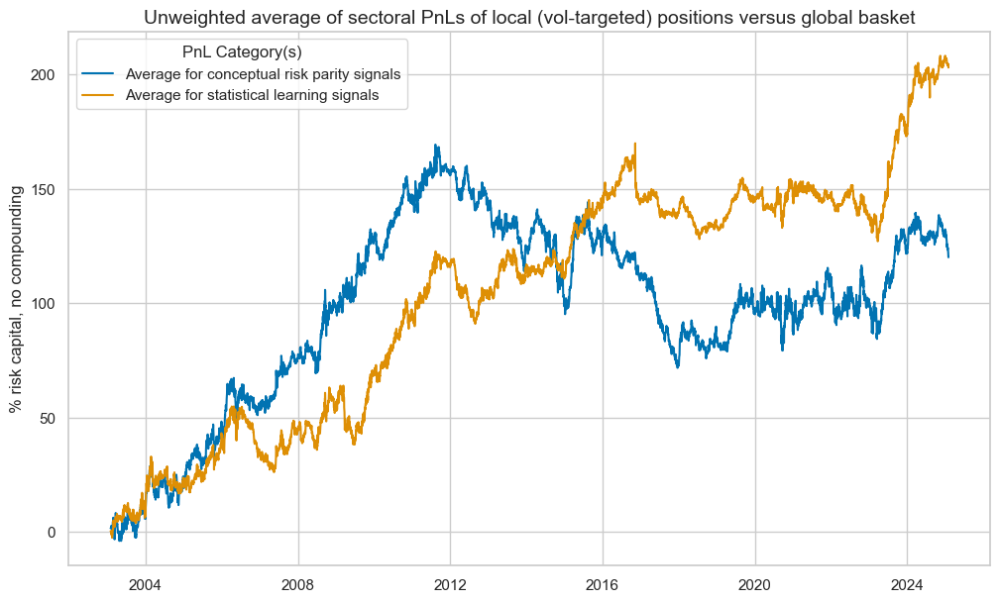

In [141]:
multisignal_multisector_pnls.plot_pnls(
    [
        f"Average for {signal_desc} signals"
        for signal_type, signal_desc in signal_families.items()
    ],
    title="Unweighted average of sectoral PnLs of local (vol-targeted) positions versus global basket",
)

In [142]:
for signal_type, signal_desc in signal_families.items():

    summary_table = multisignal_multisector_pnls.performance_summary.get(signal_type).transpose().style.format("{:.2f}").set_caption(
        f"Naive PnL statistics for {signal_families[signal_type]} signals"
    ).set_table_styles(
        [
            {
                "selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]
            }
        ]
    )
    display(summary_table)

,Return %,St. Dev. %,Sharpe Ratio,Sortino Ratio,Max 21-Day Draw %,Max 6-Month Draw %,Peak to Trough Draw %,Top 5% Monthly PnL Share,USD_EQXR_NSA correl,Traded Months
Energy,12.81,48.82,0.26,0.47,-49.12,-93.58,-124.99,1.32,0.08,265.00
Materials,19.53,38.37,0.51,0.74,-38.87,-60.11,-98.65,0.72,-0.03,265.00
Industrials,15.93,36.49,0.44,0.63,-34.49,-47.09,-89.37,0.78,0.00,265.00
Cons. discretionary,16.25,36.81,0.44,0.63,-37.92,-67.47,-149.49,0.88,-0.01,265.00
Cons. staples,23.55,37.15,0.63,0.95,-37.35,-53.54,-97.19,0.66,0.01,265.00
Healthcare,3.19,47.72,0.07,0.09,-58.07,-62.75,-162.30,5.32,0.00,265.00
Financials,13.33,33.14,0.40,0.57,-42.82,-39.82,-54.28,0.86,-0.01,265.00
Information tech,2.36,33.18,0.07,0.10,-43.58,-63.90,-137.67,4.96,0.02,265.00
Communication services,4.79,43.62,0.11,0.16,-54.46,-59.62,-186.29,3.12,0.08,265.00
Utilities,1.69,34.83,0.05,0.07,-46.47,-66.65,-143.75,6.73,0.02,265.00


,Return %,St. Dev. %,Sharpe Ratio,Sortino Ratio,Max 21-Day Draw %,Max 6-Month Draw %,Peak to Trough Draw %,Top 5% Monthly PnL Share,USD_EQXR_NSA correl,Traded Months
Energy,8.83,41.68,0.21,0.30,-56.54,-117.88,-213.97,1.58,-0.00,265.00
Materials,10.24,41.87,0.24,0.35,-49.07,-95.42,-132.21,1.39,-0.02,265.00
Industrials,15.15,41.85,0.36,0.52,-57.79,-79.90,-107.37,1.03,-0.00,265.00
Cons. discretionary,-4.33,43.63,-0.10,-0.14,-52.52,-74.55,-258.39,-3.45,-0.03,265.00
Cons. staples,14.42,44.88,0.32,0.47,-47.27,-85.44,-181.31,1.36,-0.02,265.00
Healthcare,5.80,45.38,0.13,0.18,-53.91,-101.34,-249.55,3.40,0.01,265.00
Financials,12.06,40.85,0.30,0.42,-37.93,-49.19,-77.55,1.13,-0.04,265.00
Information tech,-0.77,42.15,-0.02,-0.03,-43.42,-81.93,-162.00,-20.81,-0.02,265.00
Communication services,1.92,44.09,0.04,0.06,-47.78,-89.21,-189.28,8.10,-0.01,265.00
Utilities,1.52,43.87,0.03,0.05,-51.96,-99.54,-215.28,9.93,0.01,265.00
